In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colorbar as colorbar
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from itertools import product
import seaborn as sns
import torch.utils.benchmark as benchmark
from icl.figures.task_vec_viz import *
from tqdm.notebook import tqdm, trange
import pandas as pd
import os
from scipy.optimize import curve_fit

import plotly.io as pio
pio.renderers.default = "notebook_connected"
import plotly.graph_objects as go

# from run_exp import run_exp
# import linear_algebra_utils as lau
from icl.utils.train import BaseTrainer, train_model_with_plot
from icl.config import get_config_base
from icl.tasks import LatentMarkov, LatentIDBayes, LatentOODBayes
from icl.models import Transformer
from icl.utils import visualize_attention
from icl.utils.train_utils import get_attn_base, compute_cross_entropy, ih_score, get_attn_at_layer_base
from icl.figures.head_view import *
import icl.utils.task_vec as task_vec
import icl.utils.notebook_utils as nu

torch.set_printoptions(precision=3, sci_mode=False)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [123]:
import math, random
from dataclasses import dataclass
from typing import Callable, Optional, Iterator, Tuple

import torch
import torch.nn as nn
import torch.nn.functional as F


@dataclass
class Cfg:
    layer_index: int = 4
    B_pool: int = 256
    Bmasked: int = 32
    max_tasks: int = 5  
    train_calls: int = 4   
    eval_calls: int = 4     
    n_codes: int = 512
    l1: float = 1e-2
    sae_lr: float = 4e-3
    epochs: int = 8
    center_acts: bool = True
    scale_acts: bool = True
    eps: float = 1e-5
    device: str = "cuda" if torch.cuda.is_available() else "cpu"
    seed: int = 42


class SAE(nn.Module):
    def __init__(self, input_dim: int, n_codes: int):
        super().__init__()
        self.enc = nn.Linear(input_dim, n_codes)
        self.dec = nn.Linear(n_codes, input_dim, bias=True)
        nn.init.kaiming_uniform_(self.enc.weight, a=math.sqrt(5))
        nn.init.zeros_(self.enc.bias)
        nn.init.xavier_uniform_(self.dec.weight)
        nn.init.zeros_(self.dec.bias)

    def forward(self, x):
        codes = F.relu(self.enc(x))
        recon = self.dec(codes)
        return recon, codes

def flatten_acts_with_labels(
    acts: torch.Tensor,  # (Tsk, V, S, Bm, D)
    start_task_id: int = 0
) -> Tuple[torch.Tensor, torch.Tensor]:
    assert acts.ndim == 5, f"expected 5D (Tsk,V,S,Bm,D), got {acts.shape}"
    Tsk, V, S, Bm, D = acts.shape
    task_ids = torch.arange(start_task_id, start_task_id + Tsk, device=acts.device).view(Tsk, 1, 1, 1)
    task_ids = task_ids.expand(Tsk, V, S, Bm).reshape(-1)  # (N,)
    labels = torch.where(task_ids <= 2, task_ids, torch.full_like(task_ids, 3))
    X = acts.reshape(-1, D).contiguous()
    return X, labels.to(torch.long)


class TokenwiseActsDataset(torch.utils.data.IterableDataset):
    def __init__(
        self,
        compute_fn: Callable[[], torch.Tensor],
        calls: int,
        normalize: bool = True,
        center: bool = True,
        scale: bool = True,
        eps: float = 1e-5,
    ):
        super().__init__()
        self.compute_fn = compute_fn
        self.calls = calls
        self.normalize = normalize
        self.center = center
        self.scale = scale
        self.eps = eps

    def _normalize(self, X: torch.Tensor) -> torch.Tensor:
        if not self.normalize:
            return X
        if self.center:
            X = X - X.mean(dim=0, keepdim=True)
        if self.scale:
            std = X.std(dim=0, keepdim=True)
            X = X / (std + self.eps)
        return X

    def __iter__(self):）
        calls_left = self.calls
        buf_X = None
        buf_y = None
        i = 0

        def refill() -> bool:
            nonlocal calls_left, buf_X, buf_y, i
            if calls_left <= 0:
                return False
            acts = self.compute_fn()  # (max_tasks, voc, seq_len, Bmasked, D)
            if not torch.is_tensor(acts):
                acts = torch.tensor(acts)
            X, y = flatten_acts_with_labels(acts)  # (N,D), (N,)
            X = self._normalize(X.cpu())
            y = y.cpu()
            buf_X, buf_y = X, y
            i = 0
            calls_left -= 1
            return True

        while True:
            if buf_X is None or i >= buf_X.size(0):
                if not refill():
                    break
            N = buf_X.size(0)
            chunk = 2048
            j = min(i + chunk, N)
            yield buf_X[i:j], buf_y[i:j]
            i = j


class LinearProbe(nn.Module):
    def __init__(self, n_codes: int, n_classes: int = 4):
        super().__init__()
        self.fc = nn.Linear(n_codes, n_classes)

    def forward(self, c): return self.fc(c)


@torch.no_grad()
def analyze_codes_vs_labels(
    codes: torch.Tensor,
    labels: torch.Tensor,
    topk: int = 20,
    use_hard_filter: bool = True,
    min_mean: float = 0.10,       
    min_rate: float = 0.10,       
    use_composite_score: bool = True,
    alpha: float = 1.0,           
    beta: float = 1.0,            
):
    codes = codes.detach().cpu()
    labels = labels.detach().cpu()
    K = codes.shape[1]
    C = int(labels.max().item() + 1)

    thr = torch.quantile(codes, 0.5, dim=0)
    mean_table = torch.zeros(K, C)
    rate_table = torch.zeros(K, C)
    for y in range(C):
        idx = (labels == y).nonzero(as_tuple=True)[0]
        cy = codes[idx]
        mean_table[:, y] = cy.mean(dim=0)
        rate_table[:, y] = (cy > thr).float().mean(dim=0)

    pref = mean_table / (mean_table.sum(dim=1, keepdim=True) + 1e-8)

    print("\n=== Per-label top codes (with filtering/scoring) ===")
    for y in range(C):
        mean_y = mean_table[:, y]
        rate_y = rate_table[:, y]
        mean_others = (mean_table.sum(dim=1) - mean_y) / (C - 1 + 1e-8)

        if use_hard_filter:
            keep_mask = (mean_y >= min_mean) & (rate_y >= min_rate)
        else:
            keep_mask = torch.ones(K, dtype=torch.bool)

        if use_composite_score:
            strength_ratio = mean_y / (mean_y + mean_others + 1e-8)  # ∈(0,1)
            score = pref[:, y] * (strength_ratio.clamp_min(1e-8) ** alpha) * ((rate_y + 1e-3) ** beta)
        else:
            score = pref[:, y]

        idx_keep = torch.nonzero(keep_mask, as_tuple=True)[0]
        if idx_keep.numel() >= 1:
            sc_keep = score[idx_keep]
            top_rel = torch.topk(sc_keep, k=min(topk, sc_keep.numel())).indices
            top_idx = idx_keep[top_rel].tolist()
        else:
            top_idx = torch.topk(pref[:, y], k=min(topk, K)).indices.tolist()

        print(f"\nLabel {y}:")
        for k in top_idx:
            m_all = ", ".join([f"{v:.4f}" for v in mean_table[k]])
            r_all = ", ".join([f"{v:.3f}" for v in rate_table[k]])
            print(
                f"  code#{k:>3d} | pref={pref[k,y]:.3f} | mean_y={mean_table[k,y]:.4f} "
                f"| rate_y={rate_table[k,y]:.3f} | score={score[k]:.4f} "
                f"| means=[{m_all}] | rates=[{r_all}]"
            )

    return mean_table, rate_table

In [333]:
import torch
import matplotlib.pyplot as plt

@torch.no_grad()
def pick_top_codes_per_label(
    mean_table: torch.Tensor,
    rate_table: torch.Tensor,
    topk: int = 5,
    min_mean: float = 0.10,
    min_rate: float = 0.10,
    alpha: float = 1.0,   
    beta: float = 1.0,    
):
    K, C = mean_table.shape[0], mean_table.shape[1]
    pref = mean_table / (mean_table.sum(dim=1, keepdim=True) + 1e-8)

    top_codes = {}
    scores_per_label = {}

    for y in range(C):
        mean_y = mean_table[:, y]
        rate_y = rate_table[:, y]
        mean_others = (mean_table.sum(dim=1) - mean_y) / (C - 1 + 1e-8)

        keep_mask = (mean_y >= min_mean) & (rate_y >= min_rate)
        strength_ratio = mean_y / (mean_y + mean_others + 1e-8)
        score = pref[:, y] * (strength_ratio.clamp_min(1e-8) ** alpha) * ((rate_y + 1e-3) ** beta)

        idx_keep = torch.nonzero(keep_mask, as_tuple=True)[0]
        if idx_keep.numel() == 0:
            idx_top = torch.topk(pref[:, y], k=min(topk, K)).indices
        else:
            sc_keep = score[idx_keep]
            idx_rel = torch.topk(sc_keep, k=min(topk, sc_keep.numel())).indices
            idx_top = idx_keep[idx_rel]

        top_codes[y] = idx_top.tolist()
        scores_per_label[y] = score[idx_top].tolist()

    return top_codes, pref


@torch.no_grad()
def visualize_decoder_geometry(
    sae,                      
    mean_table: torch.Tensor,
    rate_table: torch.Tensor, 
    topk_per_label: int = 5,
    labels_to_show=None,      
    min_mean: float = 0.10,
    min_rate: float = 0.10,
    alpha: float = 1.0,
    beta: float = 1.0,
):
    K, C = mean_table.shape[0], mean_table.shape[1]
    if labels_to_show is None:
        labels_to_show = list(range(C))

    top_codes_by_label, pref = pick_top_codes_per_label(
        mean_table, rate_table, topk=topk_per_label,
        min_mean=min_mean, min_rate=min_rate,
        alpha=alpha, beta=beta
    )

    order = []
    tags  = []
    seen = set()
    for y in labels_to_show:
        for k in top_codes_by_label[y]:
            if k not in seen:
                seen.add(k)
                order.append(k)
                tags.append(f"{k} (L{y})")

    if len(order) < 2:
        print("[viz] Less than 2 codes selected; nothing to visualize.")
        return

    W = sae.dec.weight.detach().cpu()   # (D, K)
    A = W[:, order]                     # (D, M)
    An = A / (A.norm(dim=0, keepdim=True) + 1e-8)

    cosM = (An.t() @ An)                # (M, M)
    max_coh = float(cosM.abs().fill_diagonal_(0).max())
    print(f"[atoms] max mutual coherence among selected = {max_coh:.3f}")

    A_center = A - A.mean(dim=0, keepdim=True)   
    U, S, Vt = torch.linalg.svd(A_center, full_matrices=False)  
    coords = Vt[:2, :].t()               
    var_ratio = (S**2) / (S**2).sum()
    print(f"[atoms] PCA explained ratio (first 2): {float(var_ratio[:2].sum()):.3f}")

    margins = []
    for k in order:
        y_star = int(torch.argmax(pref[k]).item())
        m_y = float(mean_table[k, y_star])
        m_other = float(torch.max(mean_table[k, torch.arange(C)!=y_star]))
        margins.append(m_y - m_other)

    plt.figure(figsize=(6, 5))
    plt.imshow(cosM.numpy(), interpolation='nearest')
    plt.title("Decoder atom cosine similarity")
    plt.xticks(range(len(order)), tags, rotation=90)
    plt.yticks(range(len(order)), tags)
    plt.colorbar()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(6, 5))
    plt.scatter(coords[:,0].numpy(), coords[:,1].numpy())
    for i, txt in enumerate(tags):
        plt.annotate(txt, (coords[i,0].item(), coords[i,1].item()))
    plt.title("Decoder atoms: PCA projection (PC1 vs PC2)")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.tight_layout()
    plt.show()

    cos_off = cosM.clone()
    cos_off.fill_diagonal_(0)
    redund = cos_off.abs().max(dim=1).values.tolist()
    print("\n[per-code summary]")
    for i, k in enumerate(order):
        print(f"  code#{k:>4d} | redund(|cos|max)={redund[i]:.3f} | margin={margins[i]:.4f} | tag={tags[i]}")

    return An

In [117]:
import copy

cfg = Cfg()
torch.manual_seed(cfg.seed); random.seed(cfg.seed)
device = cfg.device
print("Using device:", device)
sampler_base = copy.deepcopy(sampler)

_call_idx = {"i": 0}

@torch.no_grad()
def compute_fn():
    i = _call_idx["i"]; _call_idx["i"] += 1
    torch.manual_seed(cfg.seed + i)
    random.seed(cfg.seed + i)
    np.random.seed(cfg.seed + i)

    sampler_base.minor_trans_mat = sampler_base._sample_banded_trans_mats(
        sampler_base.n_minor_tasks
    )

    acts = compute_hiddens_tokenwise_mlp(
        config=config,
        model=model,
        sampler=sampler_base,            
        layer_index=cfg.layer_index,
        B_pool=cfg.B_pool,
        Bmasked=cfg.Bmasked,
        max_tasks=cfg.max_tasks,
    )
    if not torch.is_tensor(acts):
        acts = torch.tensor(acts)
    return acts  


with torch.no_grad():
    probe_acts = compute_fn()
assert probe_acts.ndim == 5, f"Extractor must return 5D, got {probe_acts.shape}"
D = probe_acts.shape[-1]
print(f"[info] activations shape example: {tuple(probe_acts.shape)} -> D={D}")

train_ds = TokenwiseActsDataset(
    compute_fn=compute_fn,
    calls=cfg.train_calls,          
    normalize=True,
    center=cfg.center_acts,
    scale=cfg.scale_acts,
    eps=cfg.eps,
)

train_loader = torch.utils.data.DataLoader(
    train_ds,
    batch_size=None,                
    shuffle=False,
    num_workers=0,                  
    pin_memory=True,
)


sae = SAE(input_dim=D, n_codes=cfg.n_codes).to(device)
opt = torch.optim.Adam(sae.parameters(), lr=cfg.sae_lr)

Using device: cuda


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[info] activations shape example: (5, 5, 63, 32, 128) -> D=128


In [118]:
# train
for ep in range(1, cfg.epochs + 1):
    sae.train()
    total, total_mse, total_l1 = 0.0, 0.0, 0.0
    n_seen = 0
    for X_cpu, _ in train_loader:
        X = X_cpu.to(device, non_blocking=True).float()
        recon, codes = sae(X)
        mse = F.mse_loss(recon, X)
        l1 = codes.abs().mean()
        loss = mse + cfg.l1 * l1
        opt.zero_grad()
        loss.backward()
        opt.step()

        bsz = X.size(0)
        total += loss.item() * bsz
        total_mse += mse.item() * bsz
        total_l1 += l1.item() * bsz
        n_seen += bsz

    print(f"[SAE] epoch {ep:02d}/{cfg.epochs} | loss={total/n_seen:.6f} | mse={total_mse/n_seen:.6f} | l1={total_l1/n_seen:.6f}")


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 01/8 | loss=0.667483 | mse=0.664614 | l1=0.286964


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 02/8 | loss=0.516078 | mse=0.513781 | l1=0.229736


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 03/8 | loss=0.435919 | mse=0.433960 | l1=0.195878


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 04/8 | loss=0.508830 | mse=0.506968 | l1=0.186235


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 05/8 | loss=0.478782 | mse=0.477110 | l1=0.167213


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 06/8 | loss=0.547295 | mse=0.545746 | l1=0.154957


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 07/8 | loss=0.574823 | mse=0.573390 | l1=0.143230


tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

[SAE] epoch 08/8 | loss=0.608076 | mse=0.606656 | l1=0.141982


In [121]:
@torch.no_grad()
def collect_eval(num_calls: int):
    Xs, Ys = [], []
    for _ in range(num_calls):
        acts = compute_fn()
        X, y = flatten_acts_with_labels(acts)
        Xs.append(X)
        Ys.append(y)
    X = torch.cat(Xs, dim=0)
    y = torch.cat(Ys, dim=0)
    if cfg.center_acts:
        X = X - X.mean(dim=0, keepdim=True)
    if cfg.scale_acts:
        std = X.std(dim=0, keepdim=True)
        X = X / (std + cfg.eps)
    return X, y

with torch.no_grad():
    X_eval, y_eval = collect_eval(cfg.eval_calls)
    X_eval = X_eval.to(device).float()
    _, codes_eval = sae(X_eval)
    codes_eval = codes_eval.detach().cpu()
    y_eval = y_eval.cpu()

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

tasks:   0%|          | 0/5 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]


=== Per-label top codes (by normalized mean) ===

Label 0:
  code#324 | pref=0.952 | mean_y=0.9790 | rate_y=0.859 | means=[0.9790, 0.0323, 0.0001, 0.0166] | rates=[0.859, 0.108, 0.001, 0.053]
  code#364 | pref=0.933 | mean_y=0.8884 | rate_y=0.896 | means=[0.8884, 0.0120, 0.0024, 0.0494] | rates=[0.896, 0.033, 0.010, 0.154]
  code# 52 | pref=0.925 | mean_y=0.6579 | rate_y=0.807 | means=[0.6579, 0.0064, 0.0253, 0.0213] | rates=[0.807, 0.030, 0.132, 0.067]
  code#382 | pref=0.919 | mean_y=0.5613 | rate_y=0.823 | means=[0.5613, 0.0010, 0.0034, 0.0448] | rates=[0.823, 0.005, 0.019, 0.181]
  code# 33 | pref=0.911 | mean_y=1.4640 | rate_y=0.905 | means=[1.4640, 0.0342, 0.0197, 0.0899] | rates=[0.905, 0.036, 0.027, 0.164]
  code#177 | pref=0.904 | mean_y=0.0158 | rate_y=0.122 | means=[0.0158, 0.0000, 0.0001, 0.0015] | rates=[0.122, 0.000, 0.001, 0.018]
  code#379 | pref=0.901 | mean_y=0.9589 | rate_y=0.862 | means=[0.9589, 0.0144, 0.0020, 0.0889] | rates=[0.862, 0.030, 0.010, 0.183]
  code#  

In [246]:
mean_table, rate_table = analyze_codes_vs_labels(codes_eval, y_eval, topk=10)


=== Per-label top codes (with filtering/scoring) ===

Label 0:
  code#364 | pref=0.933 | mean_y=0.8884 | rate_y=0.896 | score=0.8176 | means=[0.8884, 0.0120, 0.0024, 0.0494] | rates=[0.896, 0.033, 0.010, 0.154]
  code#324 | pref=0.952 | mean_y=0.9790 | rate_y=0.859 | score=0.8058 | means=[0.9790, 0.0323, 0.0001, 0.0166] | rates=[0.859, 0.108, 0.001, 0.053]
  code# 33 | pref=0.911 | mean_y=1.4640 | rate_y=0.905 | score=0.7989 | means=[1.4640, 0.0342, 0.0197, 0.0899] | rates=[0.905, 0.036, 0.027, 0.164]
  code#379 | pref=0.901 | mean_y=0.9589 | rate_y=0.862 | score=0.7501 | means=[0.9589, 0.0144, 0.0020, 0.0889] | rates=[0.862, 0.030, 0.010, 0.183]
  code#273 | pref=0.885 | mean_y=0.7492 | rate_y=0.871 | score=0.7404 | means=[0.7492, 0.0353, 0.0152, 0.0465] | rates=[0.871, 0.067, 0.026, 0.098]
  code#382 | pref=0.919 | mean_y=0.5613 | rate_y=0.823 | score=0.7358 | means=[0.5613, 0.0010, 0.0034, 0.0448] | rates=[0.823, 0.005, 0.019, 0.181]
  code# 75 | pref=0.859 | mean_y=1.0450 | rate_y

[atoms] max mutual coherence among selected = 0.454
[atoms] PCA explained ratio (first 2): 0.298


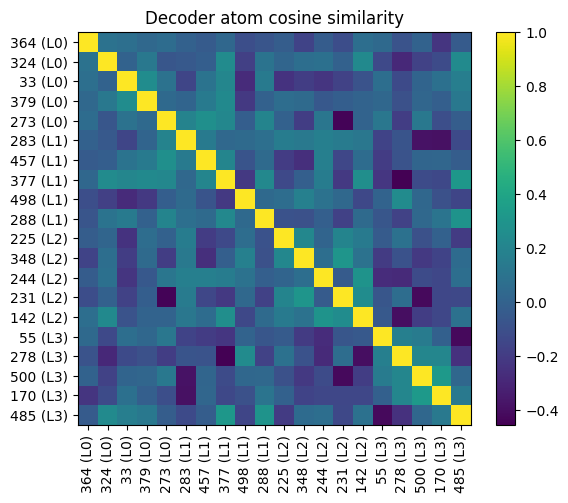

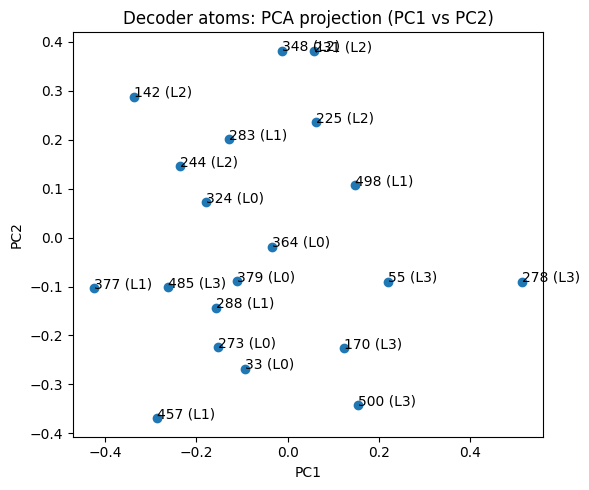


[per-code summary]
  code# 364 | redund(|cos|max)=0.231 | margin=0.8390 | tag=364 (L0)
  code# 324 | redund(|cos|max)=0.288 | margin=0.9466 | tag=324 (L0)
  code#  33 | redund(|cos|max)=0.278 | margin=1.3741 | tag=33 (L0)
  code# 379 | redund(|cos|max)=0.255 | margin=0.8700 | tag=379 (L0)
  code# 273 | redund(|cos|max)=0.438 | margin=0.7027 | tag=273 (L0)
  code# 283 | redund(|cos|max)=0.386 | margin=1.7022 | tag=283 (L1)
  code# 457 | redund(|cos|max)=0.269 | margin=2.2745 | tag=457 (L1)
  code# 377 | redund(|cos|max)=0.454 | margin=2.0899 | tag=377 (L1)
  code# 498 | redund(|cos|max)=0.278 | margin=1.1430 | tag=498 (L1)
  code# 288 | redund(|cos|max)=0.290 | margin=1.6554 | tag=288 (L1)
  code# 225 | redund(|cos|max)=0.243 | margin=2.2933 | tag=225 (L2)
  code# 348 | redund(|cos|max)=0.304 | margin=1.3648 | tag=348 (L2)
  code# 244 | redund(|cos|max)=0.291 | margin=1.7489 | tag=244 (L2)
  code# 231 | redund(|cos|max)=0.438 | margin=0.9725 | tag=231 (L2)
  code# 142 | redund(|cos|max

In [334]:
An = visualize_decoder_geometry(
    sae,
    mean_table, rate_table,
    topk_per_label=5,            
    labels_to_show=[0,1,2,3],    
    min_mean=0.10, min_rate=0.10,
    alpha=1.0, beta=1.0,
)

In [340]:
UA, _, _ = torch.svd(An[:, -5:])

In [139]:
# Linear Probe
probe = LinearProbe(n_codes=cfg.n_codes, n_classes=4).to(device)
opt_p = torch.optim.Adam(probe.parameters(), lr=5e-3)
probe_epochs = 8
ds = torch.utils.data.TensorDataset(codes_eval, y_eval)
dl = torch.utils.data.DataLoader(ds, batch_size=8192, shuffle=True)
for ep in range(1, probe_epochs + 1):
    tot, correct, n = 0.0, 0, 0
    for xb, yb in dl:
        xb, yb = xb.to(device), yb.to(device)
        logits = probe(xb)
        loss = F.cross_entropy(logits, yb)
        opt_p.zero_grad(); loss.backward(); opt_p.step()
        tot += loss.item() * xb.size(0)
        correct += (logits.argmax(1) == yb).sum().item()
        n += xb.size(0)
    print(f"[Probe] ep {ep:02d} | loss={tot/n:.4f} | acc={correct/n:.4f}")

with torch.no_grad():
    logits = probe(codes_eval.to(device))
    acc = (logits.argmax(1).cpu() == y_eval).float().mean().item()
print(f"\n[Probe] final eval acc = {acc:.4f}")

W = probe.fc.weight.detach().cpu()  # (4, n_codes)
print("\n=== Top +weight codes per label (from linear probe) ===")
for y in range(4):
    vals, inds = torch.topk(W[y], k=min(10, cfg.n_codes))
    pairs = ", ".join([f"(code#{int(i)}, w={float(v):.3f})" for v, i in zip(vals, inds)])
    print(f"Label {y}: {pairs}")

[Probe] ep 01 | loss=0.4282 | acc=0.8738
[Probe] ep 02 | loss=0.2586 | acc=0.9052
[Probe] ep 03 | loss=0.2386 | acc=0.9094
[Probe] ep 04 | loss=0.2291 | acc=0.9115
[Probe] ep 05 | loss=0.2234 | acc=0.9124
[Probe] ep 06 | loss=0.2194 | acc=0.9131
[Probe] ep 07 | loss=0.2164 | acc=0.9137
[Probe] ep 08 | loss=0.2142 | acc=0.9138

[Probe] final eval acc = 0.9142

=== Top +weight codes per label (from linear probe) ===
Label 0: (code#408, w=0.583), (code#494, w=0.410), (code#93, w=0.404), (code#5, w=0.362), (code#239, w=0.335), (code#141, w=0.329), (code#115, w=0.317), (code#370, w=0.312), (code#484, w=0.267), (code#83, w=0.255)
Label 1: (code#293, w=0.391), (code#221, w=0.377), (code#266, w=0.324), (code#482, w=0.316), (code#112, w=0.301), (code#156, w=0.264), (code#63, w=0.247), (code#408, w=0.240), (code#264, w=0.238), (code#439, w=0.219)
Label 2: (code#141, w=0.511), (code#351, w=0.510), (code#219, w=0.454), (code#199, w=0.429), (code#263, w=0.362), (code#39, w=0.331), (code#326, w=0.32

In [80]:
config = get_config_base()
config.task.n_minor_tasks = 2**10
model = Transformer(config)
model = model.to(config.device)
train_results = train_model_with_plot(model, config, show=False, verbose=False)

Experiment directory:  ..\results\latent\train_def3abbe0972f443c821ccbe480c5a06


eval/IDLoss,█▅▄▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval/OODLoss,█▆▆▅▄▃▃▃▃▃▂▂▂▂▂▁▂▂▁▂▂▁▂▁▂▂▂▂▂▂▁▂▁▂▁▁▂▁▁▁
eval/loss,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▆▆▃▃▄▄▄▂▃▄▄▅▃▃▄▁▂▃▃▃▂▂▃▃▄▃▂▃▂▄▂▃▄▃▂▂▃▄▃
train/lr,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval/IDLoss,0.46342
eval/OODLoss,0.47547
eval/loss,0.46342
train/loss,0.45507
train/lr,0.0002


C:\Users\User\anaconda3\envs\LLM\lib\site-packages\pydantic\main.py:308: UserWarning:

Pydantic serializer warnings:
  Expected `list[str]` but got `tuple` - serialized value may not be as expected
  Expected `list[str]` but got `tuple` - serialized value may not be as expected



Saving final model...
Training: 376.072502 s
Loss plots saved at ..\results\latent\train_def3abbe0972f443c821ccbe480c5a06\plots
..\results\latent\train_def3abbe0972f443c821ccbe480c5a06\plots\loss.png


In [81]:
model, sampler, config = nu.load_everything("latent", "train_def3abbe0972f443c821ccbe480c5a06")
# bayes_id = LatentIDBayes(sampler.trans_mat, device="cpu")
# bayes_ood = LatentOODBayes(config.vocab_size-1, config.task.alpha, device="cpu")

In [3]:
from typing import Tuple

def compute_hiddens(config,
                    model: torch.nn.Module,
                    sampler,
                    layer_index: int = 1,
                    return_final: bool = False,
                    ) -> Tuple[torch.Tensor, torch.Tensor]:
    """
    extract hidden representation from given layer attn_block:
    - return_final=True:  (n_tasks, B, n_embd)
    - return_final=False: (n_tasks, seq_len, B, n_embd)
    """
    device = config.device
    B = 256 
    max_tasks = 32
    n_tasks = min(max_tasks, sampler.n_major_tasks + sampler.n_minor_tasks)
    seq_len = sampler.seq_len
    n_embd = config.model.emb_dim

    if return_final:
        output_shape = (n_tasks, B, n_embd)
        task_pos = 2 * seq_len - 1
    else:
        output_shape = (n_tasks, seq_len-1, B, n_embd) 
        task_pos = 2 * torch.arange(seq_len-1, device=device) + 1  # (seq_len-1,)

    all_hiddens = torch.empty(output_shape, device=device)

    def run_and_extract(batch_data: torch.Tensor, pos):
        cache = {}

        def hook_fn(module, inp, out):
            # out: (B, L, d_model)
            if isinstance(pos, torch.Tensor):
                # (B, P, d)
                cache['vecs'] = out.index_select(dim=1, index=pos).detach()
            else:
                # (B, d)
                cache['vecs'] = out[:, pos, :].detach()

        handle = model.layers[layer_index].attn_block.register_forward_hook(hook_fn)
        with torch.no_grad():
            _ = model(batch_data)
        handle.remove()
        return cache['vecs']

    for i in range(n_tasks):
        demo_data, _ = sampler.generate(mode="testing", task=i, num_samples=B)  # (B, L_in)

        vecs = run_and_extract(demo_data, task_pos)
        #   return_final=True  -> (B, n_embd)
        #   return_final=False -> (B, P, n_embd)

        if return_final:
            all_hiddens[i, :, :] = vecs  # (B, d)
        else:
            all_hiddens[i, :, :, :] = vecs.permute(1, 0, 2)  # (P, B, d)
    
    return all_hiddens


### Vocabulary Size: 2 

In [82]:
hiddens = compute_hiddens(config, model, sampler, layer_index=4, return_final = False)

In [83]:
plot_task_vector_modes(hiddens[:3])

In [5]:
def compute_hiddens_tokenwise(
    config,
    model: torch.nn.Module,
    sampler,
    layer_index: int = 1,
    B_pool: int = 512,    
    Bmasked: int = 32,     
    max_tasks=16,
) -> torch.Tensor:
    device = config.device
    model_device = next(model.parameters()).device

    n_tasks = min(max_tasks, sampler.n_major_tasks + sampler.n_minor_tasks)
    seq_len = sampler.seq_len
    n_emb = getattr(config.model, "emb_dim", getattr(config.model, "n_embd", None))
    assert n_emb is not None, "config.model.emb_dim / n_embd not found"

    vocab_size = config.vocab_size
    if getattr(sampler, "pad", False):
        vocab_size_eff = vocab_size - 1
    else:
        vocab_size_eff = vocab_size

    hiddens = torch.empty(
        (n_tasks, vocab_size_eff, seq_len - 1, Bmasked, n_emb),
        device=device,
        dtype=torch.float32,
    )

    def extract_at_pos(batch_data: torch.Tensor, pos: int) -> torch.Tensor:
        cache = {}

        def hook_fn(module, inp, out):
            # out: (B, L, d_model)
            L = out.size(1)
            if not (0 <= pos < L):
                raise RuntimeError(f"hook pos={pos} out of range L={L}")
            cache["vec"] = out[:, pos, :].detach()

        handle = model.layers[layer_index].attn_block.register_forward_hook(hook_fn)
        _ = model(batch_data)
        handle.remove()
        return cache["vec"]  # (Bcur, n_emb)

    for k in trange(n_tasks, desc="tasks"):
        for t in trange(0, seq_len - 1, leave=False, desc="positions"):
            input_pos = 2 * t
            task_pos = 2 * t + 1
            samples_pool, *_ = sampler.generate(mode="test", num_samples=B_pool, task=k)
            samples_pool = samples_pool.to(device)

            for tok in range(vocab_size_eff):
                collected = []
                while True:
                    curr = samples_pool[:, : (input_pos + 1)].clone()
                    mask = curr[:, input_pos] == tok
                    matched = samples_pool[mask]  
                    if matched.size(0) > 0:
                        collected.append(matched)

                    total = sum(x.size(0) for x in collected)
                    if total >= Bmasked:
                        break
                    else:
                        samples_pool, *_ = sampler.generate(mode="test", num_samples=B_pool, task=k)
                        samples_pool = samples_pool.to(device)

                batch = torch.cat(collected, dim=0)[:Bmasked].to(device)
                vec = extract_at_pos(batch, task_pos)
                hiddens[k, tok, t, :, :] = vec

    return hiddens

In [93]:
def compute_hiddens_tokenwise_mlp(
    config,
    model: torch.nn.Module,
    sampler,
    layer_index: int = 1,
    B_pool: int = 512,    
    Bmasked: int = 32,     
    max_tasks=16,
) -> torch.Tensor:
    device = config.device
    model_device = next(model.parameters()).device

    n_tasks = min(max_tasks, sampler.n_major_tasks + sampler.n_minor_tasks)
    seq_len = sampler.seq_len
    n_emb = getattr(config.model, "emb_dim", getattr(config.model, "n_embd", None))
    assert n_emb is not None, "config.model.emb_dim / n_embd not found"

    vocab_size = config.vocab_size
    if getattr(sampler, "pad", False):
        vocab_size_eff = vocab_size - 1
    else:
        vocab_size_eff = vocab_size

    hiddens = torch.empty(
        (n_tasks, vocab_size_eff, seq_len - 1, Bmasked, n_emb),
        device=device,
        dtype=torch.float32,
    )

    def extract_at_pos(batch_data: torch.Tensor, pos: int) -> torch.Tensor:
        cache = {}

        def hook_fn(module, inp, out):
            # out: (B, L, d_model)
            L = out.size(1)
            if not (0 <= pos < L):
                raise RuntimeError(f"hook pos={pos} out of range L={L}")
            cache["vec"] = out[:, pos, :].detach()

        handle = model.layers[layer_index].mlp.register_forward_hook(hook_fn)
        _ = model(batch_data)
        handle.remove()
        return cache["vec"]  # (Bcur, n_emb)

    for k in trange(n_tasks, desc="tasks"):
        for t in trange(0, seq_len - 1, leave=False, desc="positions"):
            input_pos = 2 * t
            task_pos = 2 * t + 1
            samples_pool, *_ = sampler.generate(mode="test", num_samples=B_pool, task=k)
            samples_pool = samples_pool.to(device)

            for tok in range(vocab_size_eff):
                collected = []
                while True:
                    curr = samples_pool[:, : (input_pos + 1)].clone()
                    mask = curr[:, input_pos] == tok
                    matched = samples_pool[mask]  
                    if matched.size(0) > 0:
                        collected.append(matched)

                    total = sum(x.size(0) for x in collected)
                    if total >= Bmasked:
                        break
                    else:
                        samples_pool, *_ = sampler.generate(mode="test", num_samples=B_pool, task=k)
                        samples_pool = samples_pool.to(device)

                batch = torch.cat(collected, dim=0)[:Bmasked].to(device)
                vec = extract_at_pos(batch, task_pos)
                hiddens[k, tok, t, :, :] = vec

    return hiddens

In [254]:
import torch
from typing import List, Optional, Dict, Union

@torch.no_grad()
def steer_at_pos_and_get_next_attn_finer(
    model,
    batch: torch.Tensor,
    layer: int,                                     
    pos: Union[int, List[int]],                      

    sae = None,                                      
    codes_zero: Optional[List[int]] = None,          
    codes_set:  Optional[Dict[int, float]] = None,   
    set_mode: str = "absolute",                      
    clamp_nonneg: bool = True,                       

    delta_vec: Optional[torch.Tensor] = None,        
    code_ids: Optional[List[int]] = None,            
    code_weights: Optional[torch.Tensor] = None,
    alpha: float = 0.2,
    normalize: bool = True,                          

    l2_budget: Optional[float] = None,               
    batch_index: Optional[int] = None,               

) -> Dict[str, torch.Tensor]:
    cache: Dict[str, torch.Tensor] = {"vec_before": None, "vec_after": None, "attn_next": None}

    if isinstance(pos, int):
        pos_list = [pos]
    else:
        pos_list = list(pos)
    P_list = torch.tensor(pos_list, dtype=torch.long)

    steer_module = model.layers[layer].mlp
    attn_module_next = model.layers[layer + 1].attn_block.MHA

    use_code_space = (sae is not None) and (
        (codes_zero and len(codes_zero) > 0) or (codes_set and len(codes_set) > 0)
    )

    def steering_hook(module, inp, out):
        y = out.clone()                     
        B, T, D = y.shape

        for p in pos_list:
            if not (0 <= p < T):
                raise RuntimeError(f"steer pos={p} out of range T={T}")

        Ypos = y[:, P_list, :].detach()         # (B,P,D) for record
        cache["vec_before"] = Ypos.clone()

        if use_code_space:
            XP = Ypos.reshape(B * len(pos_list), D)                       
            _, C = sae(XP)                                               
            C_new = C.clone()

            if codes_zero:
                C_new[:, torch.tensor(codes_zero, device=C_new.device, dtype=torch.long)] = 0.0

            if codes_set:
                idx = torch.tensor(list(codes_set.keys()), device=C_new.device, dtype=torch.long)
                tgt = torch.tensor([codes_set[k] for k in idx.tolist()],
                                   device=C_new.device, dtype=C_new.dtype)
                if set_mode == "absolute":
                    C_new[:, idx] = tgt.unsqueeze(0).expand_as(C_new[:, idx])
                elif set_mode == "add":
                    C_new[:, idx] = C_new[:, idx] + tgt
                elif set_mode == "scale":
                    C_new[:, idx] = C_new[:, idx] * tgt
                else:
                    raise ValueError("set_mode must be one of {'absolute','add','scale'}")

            if clamp_nonneg:
                C_new.clamp_(min=0.0)

            DX = (sae.dec(C_new) - sae.dec(C)).reshape(B, len(pos_list), D)  # (B,P,D)

            
            if batch_index is not None:
                maskB = torch.zeros(B, dtype=torch.bool, device=y.device)
                maskB[batch_index] = True
                DX = torch.where(maskB[:, None, None], DX, torch.zeros_like(DX))

        else:
            if delta_vec is None:
                assert (sae is not None) and (code_ids is not None) and len(code_ids) > 0
                W = sae.dec.weight.detach()                              
                device_W = W.device
                w = W[:, code_ids] @ (torch.ones(len(code_ids), device=device_W)
                                      if code_weights is None else code_weights.to(device_W))
                if normalize:
                    w = w / (w.norm() + 1e-8)
                delta = alpha * w                                        
            else:
                delta = delta_vec
                if normalize:
                    delta = delta / (delta.norm() + 1e-8)
            delta = delta.to(y.device)

            DX = delta.view(1, 1, D).expand(B, len(pos_list), D)
            if batch_index is not None:
                maskB = torch.zeros(B, dtype=torch.bool, device=y.device)
                maskB[batch_index] = True
                DX = torch.where(maskB[:, None, None], DX, torch.zeros_like(DX))

        if l2_budget is not None:
            norms = DX.norm(dim=2, keepdim=True) + 1e-8      # (B,P,1)
            scale = (l2_budget / norms).clamp(max=1.0)
            DX = DX * scale

        y[:, P_list, :] = y[:, P_list, :] + DX

        cache["vec_after"] = y[:, P_list, :].detach().clone()   # (B,P,D)
        return y

    def capture_hook(module, inp, out):
        cache["attn_next"] = module.attn.detach().cpu().clone()  # (B,H,T,T)
        return out
        
    prev_flash = getattr(attn_module_next, "flash", None)
    if prev_flash is not None:
        attn_module_next.flash = False

    h1 = steer_module.register_forward_hook(steering_hook)
    h2 = attn_module_next.register_forward_hook(capture_hook)

    try:
        model.eval()
        _ = model(batch)
    finally:
        h1.remove()
        h2.remove()
        if prev_flash is not None:
            attn_module_next.flash = prev_flash

    cache["pos_idx"] = P_list
    return cache


In [235]:
import torch
from typing import List, Optional

@torch.no_grad()
def steer_at_pos_and_get_next_attn(
    model,
    batch: torch.Tensor,
    layer: int,              # steering at layer
    pos:   int,              
    delta_vec: Optional[torch.Tensor] = None,
    sae = None,
    code_ids: Optional[List[int]] = None,
    code_weights: Optional[torch.Tensor] = None,
    alpha: float = 0.2,
    normalize: bool = False,
    l2_budget: Optional[float] = None,
    batch_index: Optional[int] = None,
):
    cache = {"vec_before": None, "vec_after": None, "attn_next": None}

    if delta_vec is None:
        assert (sae is not None) and (code_ids is not None) and len(code_ids) > 0
        W = sae.dec.weight.detach()  # (D, K)
        device_W = W.device
        w = W[:, code_ids] @ (torch.ones(len(code_ids), device=device_W) if code_weights is None
                              else code_weights.to(device_W))
        if normalize:
            w = w / (w.norm() + 1e-8)
        delta = alpha * w
    else:
        delta = delta_vec
        if normalize:
            delta = delta / (delta.norm() + 1e-8)

    delta = delta.to(batch.device)
    
    steer_module = model.layers[layer].mlp
    attn_module_next = model.layers[layer+1].attn_block.MHA

    def steering_hook(module, inp, out):
        # out: (B, T, D)
        B, T, D = out.shape
        y = out.clone()

        cache["vec_before"] = y[:, pos, :].detach().clone()

        d = delta
        if l2_budget is not None:
            n = d.norm() + 1e-8
            if n > l2_budget:
                d = d * (l2_budget / n)

        if batch_index is None:
            y[:, pos, :] = y[:, pos, :] + d
        else:
            y[batch_index, pos, :] = y[batch_index, pos, :] + d
            
        cache["vec_after"] = y[:, pos, :].detach().clone()
        return y

    # capture hook：capture layer+1 attention weights
    def capture_hook(module, inp, out):
        cache["attn_next"] = module.attn.detach().cpu().clone()
        return out  

    prev_flash = getattr(attn_module_next, "flash", None)
    if prev_flash is not None:
        attn_module_next.flash = False

    h1 = steer_module.register_forward_hook(steering_hook)
    h2 = attn_module_next.register_forward_hook(capture_hook)

    try:
        _ = model(batch)  
    finally:
        h1.remove()
        h2.remove()
        if prev_flash is not None:
            attn_module_next.flash = prev_flash 

    return cache


In [250]:
codes_L0 = [364, 324, 33, 379, 273]
codes_L3_targets = {55:1.3848, 278:1.0264, 500:1.0383, 170:0.6075, 485:0.6138}

batch, *_ = sampler.generate(mode="test", num_samples=64, task=0)
pos = [9,11,13,15,17,19,21,23,25,27,29,31,33,35]

res = steer_at_pos_and_get_next_attn_finer(
    model=model, batch=batch,
    layer=4, pos=pos,
    sae=sae,
    codes_zero=codes_L0,
    codes_set=codes_L3_targets,
    set_mode="absolute",         
    clamp_nonneg=True,
    l2_budget=None,              
    batch_index=None             
)

attn_next = res["attn_next"]     # (B,H,T,T)
head_view([res['attn_next'][:1, :, :(pos[-1]+2), :(pos[-1]+2)]], None, 
          batch[0].tolist()[:pos[-1]+2], html_action='view')

<IPython.core.display.Javascript object>

In [ ]:
attn_map = get_attn_base(model, samples_pool[:1])
attn_tensors = [torch.zeros((1,config.model.num_heads[l],2*config.seq_len-1,2*config.seq_len-1)) for l in range(config.model.num_layers)]
for l, attn in attn_map.items():
    attn = attn.unsqueeze(0)  # Number of heads in this layer
    attn_tensors[l][:1, :config.model.num_heads[l]] = attn  # Fill attention tensor

trunc_attn = [attn_tensors[l][:1, :config.model.num_heads[l], :64, :64] for l in range(config.model.num_layers)]
# trunc_attn = [trunc_attn[l]/trunc_attn[l].sum(dim=-1, keepdims=True) for l in range(config.model.num_layers)]
head_view(trunc_attn, None, samples_pool[0].tolist()[:64], html_action='view')

In [237]:
batch, *_ = sampler.generate(mode="test", num_samples=64, task=0)
pos = [35]

res = steer_at_pos_and_get_next_attn(
    model=model, batch=batch,
    layer=4, pos=pos,
    sae=sae, code_ids=[55], alpha=0, normalize=True,
    batch_index=None 
)
head_view([res['attn_next'][:1, :, :(pos[-1]+2), :(pos[-1]+2)]], None, batch[0].tolist()[:pos[-1]+2], html_action='view')

<IPython.core.display.Javascript object>

In [245]:
res = steer_at_pos_and_get_next_attn(
    model=model, batch=batch,
    layer=4, pos=pos,
    sae=sae, code_ids=[485], alpha=10, normalize=False,
    batch_index=None 
)
head_view([res['attn_next'][:1, :, :(pos[-1]+2), :(pos[-1]+2)]], None, batch[0].tolist()[:pos[-1]+2], html_action='view')

<IPython.core.display.Javascript object>

In [234]:
batch, *_ = sampler.generate(mode="test", num_samples=64, task=0)
pos = [27, 35]
res = steer_at_pos_and_get_next_attn(
    model=model, batch=batch,
    layer=4, pos=pos,
    sae=sae, code_ids=[55], alpha=10, normalize=True,
    batch_index=None 
)
head_view([res['attn_next'][:1, :, :(pos[-1]+2), :(pos[-1]+2)]], None, batch[0].tolist()[:pos[-1]+2], html_action='view')

<IPython.core.display.Javascript object>

In [148]:
import torch

@torch.no_grad()
def induction_head_score_with_pad_i_minus_1(attn: torch.Tensor,
                                            tokens: torch.Tensor,
                                            pad_id: int,
                                            reduce: str = "mean_over_batch") -> torch.Tensor:
    """
    attention head IH score with pad, matching codition: x[j-2] == x[i-1] and x[j-1] is pad
    """
    assert attn.dim() == 4 and tokens.dim() == 2
    B, H, T, T2 = attn.shape
    assert T == T2 and tokens.shape[1] == T
    dev = attn.device
    
    idx = torch.arange(T, device=dev)
    I = idx.view(T, 1).expand(T, T)          
    J = idx.view(1, T).expand(T, T)          
    j_lt_i = (J < I)                          

    is_pad_q = (tokens == pad_id)        

    prev1_is_pad = torch.zeros((B, T), dtype=torch.bool, device=dev)
    prev1_is_pad[:, 1:] = (tokens[:, :-1] == pad_id)   

    prev2 = torch.full((B, T), fill_value=-1, dtype=tokens.dtype, device=dev)
    prev2[:, 2:] = tokens[:, :-2]                       

    i_minus1 = torch.full((B, T), fill_value=-1, dtype=tokens.dtype, device=dev)
    i_minus1[:, 1:] = tokens[:, :-1]                    

    cond_q_pad   = is_pad_q[:, :, None]                         
    cond_j_lt_i  = j_lt_i[None, :, :]                           
    cond_prev1   = prev1_is_pad[:, None, :]                     
    cond_match   = (prev2[:, None, :] == i_minus1[:, :, None])  # (B,T,T)

    M = cond_q_pad & cond_j_lt_i & cond_prev1 & cond_match     

    M_f = M.float()
    num = (attn * M_f[:, None, :, :]).sum(dim=(-1, -2))     
    den = M_f.sum(dim=(-1, -2)).clamp_min(1e-8)             
    scores_bh = num / den[:, None]                           

    if reduce == "none":
        return scores_bh
    return scores_bh.mean(dim=0)                              

In [158]:
samples_pool, *_ = sampler.generate(mode="test", num_samples=64, task=7)
attn_map = get_attn_base(model, samples_pool[:1])
scores = induction_head_score_with_pad_i_minus_1(attn_map[5], samples_pool[:1].cpu(), pad_id=5, reduce="mean_over_batch")
print("IH score per head:", scores)  # (H,)

IH score per head: tensor([0.069, 0.028])


In [147]:
attn_map[3].shape

torch.Size([1, 2, 127, 127])

In [348]:
samples_pool, *_ = sampler.generate(mode="test", num_samples=64, task=8)
attn_map = get_attn_base(model, samples_pool[:1])
attn_tensors = [torch.zeros((1,config.model.num_heads[l],2*config.seq_len-1,2*config.seq_len-1)) for l in range(config.model.num_layers)]
for l, attn in attn_map.items():
    attn = attn.unsqueeze(0)  # Number of heads in this layer
    attn_tensors[l][:1, :config.model.num_heads[l]] = attn  # Fill attention tensor

trunc_attn = [attn_tensors[l][:1, :config.model.num_heads[l], :64, :64] for l in range(config.model.num_layers)]
# trunc_attn = [trunc_attn[l]/trunc_attn[l].sum(dim=-1, keepdims=True) for l in range(config.model.num_layers)]
head_view(trunc_attn, None, samples_pool[0].tolist()[:64], html_action='view')

<IPython.core.display.Javascript object>

In [349]:
samples_pool, *_ = sampler.generate(mode="test", num_samples=64, task=0)
attn_map = get_attn_base(model, samples_pool[:1])
attn_tensors = [torch.zeros((1,config.model.num_heads[l],2*config.seq_len-1,2*config.seq_len-1)) for l in range(config.model.num_layers)]
for l, attn in attn_map.items():
    attn = attn.unsqueeze(0)  # Number of heads in this layer
    attn_tensors[l][:1, :config.model.num_heads[l]] = attn  # Fill attention tensor

trunc_attn = [attn_tensors[l][:1, :config.model.num_heads[l], :64, :64] for l in range(config.model.num_layers)]
# trunc_attn = [trunc_attn[l]/trunc_attn[l].sum(dim=-1, keepdims=True) for l in range(config.model.num_layers)]
head_view(trunc_attn, None, samples_pool[0].tolist()[:64], html_action='view')

<IPython.core.display.Javascript object>

In [69]:
import numpy as np
import plotly.graph_objects as go

def project_with_r2_size(task_vecs_over_all_time, final_task_vecs, r2_scores,
                         task_labels=None, final_labels=None,
                         size_min=6, size_max=20):
    """
    task_vecs_over_all_time: (K,T,D)
    final_task_vecs:         (3,D)
    r2_scores:               (K,T)   goodness-of-fit
    Each point's marker size is proportional to R² at the current t.
    """

    def to_np(x):
        if hasattr(x, "detach"):
            return x.detach().cpu().numpy()
        return np.asarray(x)

    X = to_np(task_vecs_over_all_time)
    F = to_np(final_task_vecs)
    R2 = to_np(r2_scores)
    K, T, D = X.shape

    # --- build projection plane from final_task_vecs ---
    F_center = F.mean(axis=0, keepdims=True)
    F0 = F - F_center
    U, S, Vt = np.linalg.svd(F0, full_matrices=False)
    basis = Vt[:2].T
    F_proj = (F - F_center) @ basis

    # Precompute projections
    X_proj_list = []
    for t in range(T):
        Xt = (X[:,t,:] - F_center) @ basis
        X_proj_list.append(Xt)

    if task_labels is None:
        task_labels = [f"task_{i}" for i in range(K)]
    if final_labels is None:
        final_labels = [f"final_{i}" for i in range(3)]

    # Map R2 -> size (linear scaling)
    def scale_sizes(r2_values):
        r2_min, r2_max = R2.min(), R2.max()
        if r2_max == r2_min:
            return np.full_like(r2_values, (size_min+size_max)/2.0)
        return size_min + (r2_values - r2_min) / (r2_max - r2_min) * (size_max - size_min)

    # Initial scatter at t=0
    t0 = 0
    X0 = X_proj_list[t0]
    sizes0 = scale_sizes(R2[:,t0])
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=X0[:,0], y=X0[:,1],
        mode="markers",
        name="tasks",
        marker=dict(size=sizes0, opacity=0.8, sizemode="diameter"),
        text=task_labels,
        customdata=R2[:,t0:t0+1],
        hovertemplate="task=%{text}<br>R²=%{customdata[0]:.3f}<br>x=%{x:.3f}, y=%{y:.3f}<extra></extra>"
    ))

    # final refs
    fig.add_trace(go.Scatter(
        x=F_proj[:,0], y=F_proj[:,1],
        mode="markers+text",
        name="final refs",
        marker=dict(size=12, symbol="star", line=dict(width=1)),
        text=final_labels,
        textposition="top center"
    ))

    # Slider steps
    steps = []
    for t in range(T):
        Xt = X_proj_list[t]
        sizes_t = scale_sizes(R2[:,t])
        steps.append(dict(
            method="update",
            args=[
                {"x": [Xt[:,0], F_proj[:,0]],
                 "y": [Xt[:,1], F_proj[:,1]],
                 "customdata": [R2[:,t:t+1], None],
                 "marker": [dict(size=sizes_t, opacity=0.8, sizemode="diameter"), None],
                 "text": [task_labels, final_labels]},
                {"title": f"Projection at t={t}"}
            ],
            label=str(t)
        ))

    fig.update_layout(
        title="Projection with R² (hover & size)",
        xaxis_title="axis 1",
        yaxis_title="axis 2",
        sliders=[dict(
            active=0,
            steps=steps,
            currentvalue=dict(prefix="t = "),
            pad=dict(t=10)
        )],
        width=800, height=650
    )
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    return fig


In [64]:
import copy
sampler_clone = copy.deepcopy(sampler)
sampler_clone.minor_trans_mat = sampler_clone._sample_banded_trans_mats(sampler_clone.n_minor_tasks)

In [89]:
hiddens_voc = compute_hiddens_tokenwise(
    config,
    model,
    sampler_clone,
    layer_index = 4,
    B_pool = 512,    
    Bmasked = 64,
    max_tasks=20,
) # (n_tasks, voc, seq_len, B, D)

tasks:   0%|          | 0/20 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

In [95]:
hiddens_voc_mlp = compute_hiddens_tokenwise_mlp(
    config,
    model,
    sampler_clone,
    layer_index = 4,
    B_pool = 512,    
    Bmasked = 64,
    max_tasks=20,
) # (n_tasks, voc, seq_len, B, D)

tasks:   0%|          | 0/20 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

positions:   0%|          | 0/63 [00:00<?, ?it/s]

In [90]:
plot_task_vector_modes(hiddens_voc[:3].reshape(-1, sampler.seq_len-1, 64, config.model.emb_dim))

In [96]:
plot_task_vector_modes(hiddens_voc_mlp[:3].reshape(-1, sampler.seq_len-1, 64, config.model.emb_dim))

In [263]:
def extract_WQK(mha: nn.Module):
    device = mha.out.weight.device
    dtype = mha.out.weight.dtype
    C = mha.emb_dim
    H = mha.n_head
    D = mha.head_dim

    if isinstance(mha.query, nn.Identity):
        WQ = torch.zeros((H, D, C), device=device, dtype=dtype)
        for h in range(H):
            start, end = h * D, (h + 1) * D
            WQ[h, :, start:end] = torch.eye(D, device=device, dtype=dtype)
    else:
        WQ_full = mha.query.weight  # (C, C)
        WQ = WQ_full.view(H, D, C).contiguous()

    if mha.attn_type == "MHA":
        WK_full = mha.key.weight  # (C, C)
        WK = WK_full.view(H, D, C).contiguous()

    else:
        raise NotImplementedError("Other types are not supported.")

    # -------- W_QK per head --------
    WQK = torch.matmul(WQ.transpose(1, 2), WK)  # (H, C, C)
    WQK_stacked = WQK.permute(1, 0, 2).reshape(C, H*C)  # (C, H*C)

    return WQK_stacked.detach()

In [268]:
hiddens_voc_mlp.shape

torch.Size([20, 5, 63, 64, 128])

In [345]:
WQK_stacked = extract_WQK(model.layers[5].attn_block.MHA)
U, S, Vh = torch.linalg.svd(WQK_stacked, full_matrices=False)  # Vh shape (H*C, C)
r = 10
U[:,:r].shape

torch.Size([128, 10])

### Token Dependence

In [329]:
from icl.linear.linear_utils import estimate_lambda_with_r2

v = 3
hiddens = hiddens_voc_mlp[:, v] # (K, T, B, D)
global_mean = hiddens[:3].mean(dim=(0,2)) # (T, D)
task_vecs_over_all_time = hiddens.mean(dim=2) - global_mean.unsqueeze(dim=0) # (K, T, D)
final_task_vecs = task_vecs_over_all_time[:3, -1]
lambdas_voc3, r2_scores, task_norms, ortho_norms = estimate_lambda_with_r2(final_task_vecs, task_vecs_over_all_time)

In [330]:
v = 4
hiddens = hiddens_voc_mlp[:, v] # (K, T, B, D)
global_mean = hiddens[:3].mean(dim=(0,2)) # (T, D)
task_vecs_over_all_time = hiddens.mean(dim=2) - global_mean.unsqueeze(dim=0) # (K, T, D)
final_task_vecs = task_vecs_over_all_time[:3, -1]
lambdas_voc4, r2_scores, task_norms, ortho_norms = estimate_lambda_with_r2(final_task_vecs, task_vecs_over_all_time)

In [324]:
resid = task_vecs_over_all_time[3:, -1] - torch.tensor(lambdas[3:, -1], device="cuda") @ final_task_vecs
Uresid, _, _ = torch.linalg.svd(resid.T, full_matrices=False)
principal_angles(Uresid, U[:,:r])

tensor([38.648, 51.076, 57.284, 63.568, 66.309, 71.660], device='cuda:0')

In [346]:
def principal_angles(U, V):
    # U, V: (n, k) and (n, m) with orthonormal columns
    M = U.T @ V
    _, s, _ = torch.svd(M)
    return torch.acos(torch.clamp(s, -1.0, 1.0)).detach() * 180 / math.pi  # principal angles in radians

Utask, _, _ = torch.linalg.svd(final_task_vecs[:2].T, full_matrices=False)
print(principal_angles(Utask, U[:,:r]))
print(principal_angles(UA.to("cuda"), U[:,:r]))

tensor([68.403, 75.797], device='cuda:0')
tensor([44.804, 67.412, 71.406, 72.681, 75.502], device='cuda:0')


In [326]:
fig = project_with_r2_size(task_vecs_over_all_time, final_task_vecs, r2_scores)
fig.show()

In [327]:
hiddens = hiddens_voc_mlp.mean(dim=1) # (K, T, B, D)
global_mean = hiddens[:3].mean(dim=(0,2)) # (T, D)
task_vecs_over_all_time = hiddens.mean(dim=2) - global_mean.unsqueeze(dim=0) # (K, T, D)
final_task_vecs = task_vecs_over_all_time[:3, -1]
lambdas, r2_scores, task_norms, ortho_norms = estimate_lambda_with_r2(final_task_vecs, task_vecs_over_all_time)
fig = project_with_r2_size(task_vecs_over_all_time, final_task_vecs, r2_scores)
fig.show()

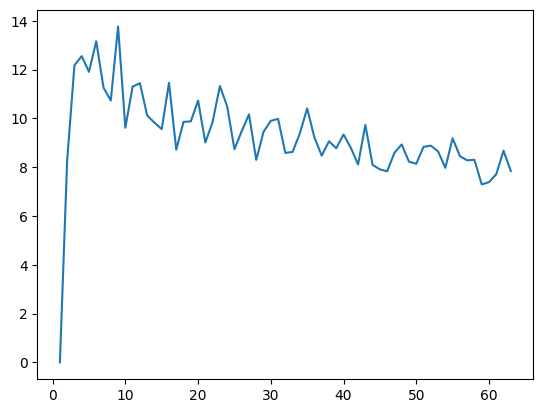

In [331]:
plt.plot(np.arange(1, 64), np.sum(np.abs(lambdas_voc3 - lambdas_voc4), axis=(0,2)))
plt.show()

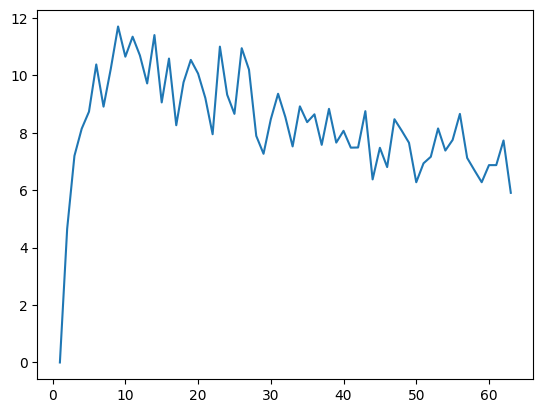

In [332]:
plt.plot(np.arange(1, 64), np.sum(np.abs(lambdas_voc3 - lambdas), axis=(0,2)))
plt.show()

In [12]:
import plotly.express as px
import numpy as np

voc_vecs_over_all_time = hiddens_voc.mean(dim=(0,3)) - global_mean.unsqueeze(dim=0)
voc_vec = hiddens_voc.mean(dim=(0,3)) - global_mean.unsqueeze(dim=0)
final_voc_vecs = voc_vec[:, -1].detach().cpu()
sim_matrix = final_voc_vecs @ final_voc_vecs.T

fig = px.imshow(
    sim_matrix,
    color_continuous_scale="Viridis",
    labels=dict(x="Vocabulary Index", y="Vocabulary Index", color="Inner Product"),
    title="Heatmap of final_voc_vecs @ final_voc_vecs.T"
)
fig.update_layout(width=700, height=600)
fig.show()

In [18]:
import plotly.graph_objects as go
import numpy as np
from scipy.optimize import curve_fit

B = 512
mixed_task_vectors = torch.zeros((config.task.total_trans, B, config.seq_len-1, config.model.emb_dim))
l0 = 1

for k in range(config.task.total_trans):
    demo_data, _ = sampler.generate(mode="test", num_samples=B, task=k)
    mixed_task_vectors[k] = task_vec.extract_task_vector(
        model, demo_data, task_pos=2*torch.arange(1, config.seq_len)-1, l=l0
    ).cpu()

In [19]:
plot_task_vector_variance_with_fit(mixed_task_vectors)

In [20]:
t0 = 4
l0 = 1
pos = 2*t0
print(f"Position: {t0}")
for k in trange(config.task.total_trans):
    samples, _ = sampler.generate(mode="test", num_samples=2048, task=k)
    for tok in range(config.vocab_size-1):
        mask = samples[:, pos] == tok
        masked_samples = samples[mask]
        preds = task_vec.predict_with_task_vector(
            model, masked_samples, 
            task_vector=task_vectors_weighted[k, tok], l=l0, pad="mapsto", pos=pos+1
        )
        probs = F.softmax(preds, dim=-1)
        raw_preds, _ = model(masked_samples)
        raw_probs = F.softmax(raw_preds, dim=-1)
        raw_gap = (raw_probs[:, (pos+1):(pos+2), :2] - sampler.trans_mat[k, tok]).abs().sum(dim=-1).mean().detach().cpu().item()
        injected_gap = (probs[:, (pos+1):(pos+2), :2] - sampler.trans_mat[k, tok]).abs().sum(dim=-1).mean().cpu().item()
        print(f"Task {k}, Token {tok}: Raw Gap = {raw_gap:.3f}, Injected Gap = {injected_gap:.3f}")


Position: 4


  0%|          | 0/3 [00:00<?, ?it/s]

Task 0, Token 0: Raw Gap = 0.345, Injected Gap = 0.360
Task 0, Token 1: Raw Gap = 0.135, Injected Gap = 0.140


OutOfMemoryError: CUDA out of memory. Tried to allocate 1.25 GiB. GPU 0 has a total capacity of 22.49 GiB of which 0 bytes is free. Including non-PyTorch memory, this process has 17179869184.00 GiB memory in use. Of the allocated memory 19.09 GiB is allocated by PyTorch, and 2.39 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [88]:
t0 = 4
l0 = 2
pos = 2*t0
print(f"Position: {t0}")
for k in trange(config.task.total_trans):
    samples, _ = sampler.generate(mode="test", num_samples=2048, task=k)
    for tok in range(config.vocab_size-1):
        mask = samples[:, pos] == tok
        masked_samples = samples[mask]
        preds = task_vec.predict_with_task_vector(
            model, masked_samples, 
            task_vector=mixed_task_vectors_weighted[k], l=l0, pad="mapsto", pos=pos+1
        )
        probs = F.softmax(preds, dim=-1)
        raw_preds, _ = model(masked_samples)
        raw_probs = F.softmax(raw_preds, dim=-1)
        raw_gap = (raw_probs[:, (pos+1):(pos+2), :5] - sampler.trans_mat[k, tok]).abs().sum(dim=-1).mean().detach().cpu().item()
        injected_gap = (probs[:, (pos+1):(pos+2), :5] - sampler.trans_mat[k, tok]).abs().sum(dim=-1).mean().cpu().item()
        print(f"Task {k}, Token {tok}: Raw Gap = {raw_gap:.3f}, Injected Gap = {injected_gap:.3f}")


Position: 4


  0%|          | 0/3 [00:00<?, ?it/s]

Task 0, Token 0: Raw Gap = 0.243, Injected Gap = 0.507
Task 0, Token 1: Raw Gap = 0.152, Injected Gap = 0.316
Task 0, Token 2: Raw Gap = 0.293, Injected Gap = 0.237
Task 0, Token 3: Raw Gap = 0.251, Injected Gap = 0.916
Task 0, Token 4: Raw Gap = 0.186, Injected Gap = 0.418
Task 1, Token 0: Raw Gap = 0.158, Injected Gap = 0.366
Task 1, Token 1: Raw Gap = 0.171, Injected Gap = 0.337
Task 1, Token 2: Raw Gap = 0.256, Injected Gap = 0.599
Task 1, Token 3: Raw Gap = 0.249, Injected Gap = 1.109
Task 1, Token 4: Raw Gap = 0.258, Injected Gap = 0.475
Task 2, Token 0: Raw Gap = 0.196, Injected Gap = 0.668
Task 2, Token 1: Raw Gap = 0.194, Injected Gap = 0.463
Task 2, Token 2: Raw Gap = 0.247, Injected Gap = 0.563
Task 2, Token 3: Raw Gap = 0.365, Injected Gap = 0.637
Task 2, Token 4: Raw Gap = 0.201, Injected Gap = 0.590


In [85]:
mc_samples = masked_samples[:, ::2]  # Use every second sample for MC sampling
preds_id = bayes_id.predict(mc_samples)
preds_ood = bayes_ood.predict(mc_samples)

In [39]:
pair_kl = nu.pairwise_kl_divergence(sampler.trans_mat, sampler.stationary)
pair_kl[pair_kl>0].min()

tensor(0.418)

In [24]:
pair_kl[pair_kl>0].median()

tensor(1.025)

In [42]:
stat_pair_kl = nu.pairwise_kl_divergence_stationary(sampler.stationary, sampler.trans_mat)
stat_pair_kl[stat_pair_kl>0].mean()

tensor(0.351)

In [9]:
nu.pairwise_kl_divergence_stationary(sampler.stationary).mean()

tensor(1.600)

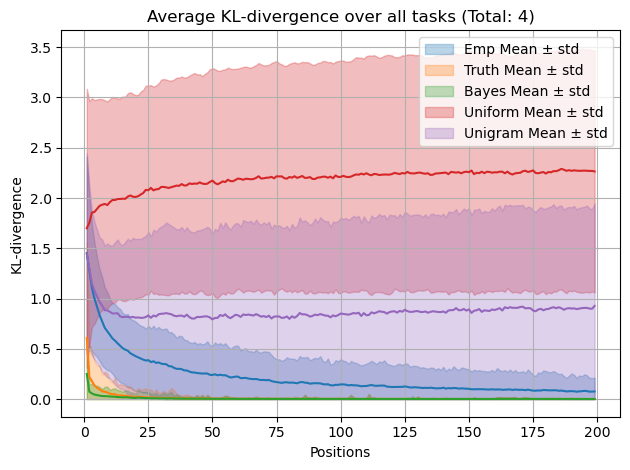

In [15]:
nu.all_kl_plot(file_path="train_a6f3b32f89cb4a7b237926a270cc0ca3", low=1, high=200)

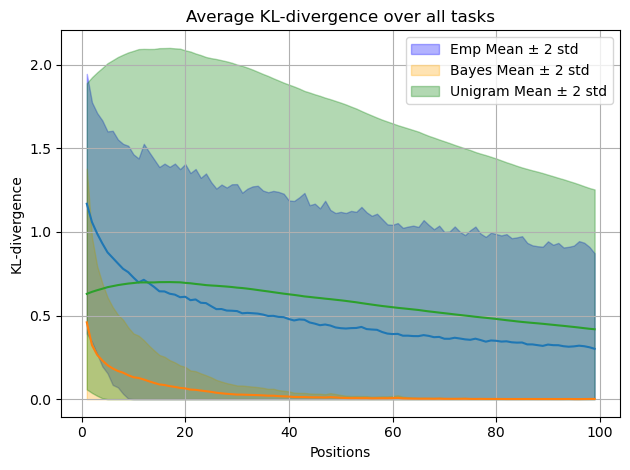

In [30]:
nu.bayes_emp_plot(file_path="train_eb47807f0858f4f323d07a41d87a1ddd", low=1, high=100)

In [83]:
folder_name = nu.get_config(vocab_size=60, total_trans=256)
if len(folder_name) > 0:
    model, sampler, config = nu.load_everything("latent", folder_name[0])

('You can choose from the following folders: '
 "['train_4a4bb22c845d1c4d4639cde5326bb2cf']")


('You can choose from the following folders: '
 "['train_6858a91be78c058c8d6f190f42bdea1f']")


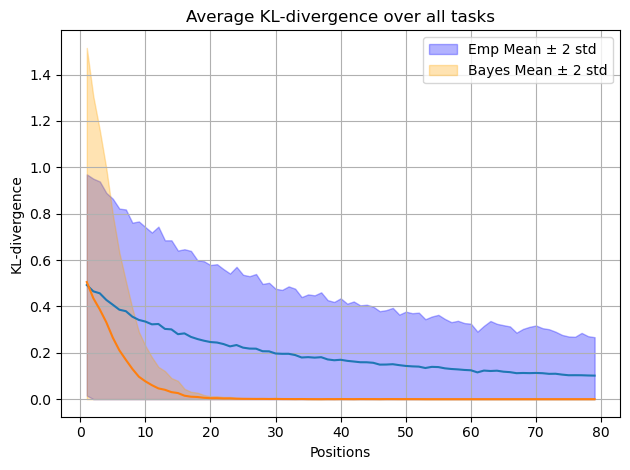

In [135]:
nu.bayes_emp_plot(vocab_size=5, total_trans=20, alpha=0.5, seq_len=128,
                  task=None, num_samples=2000, low=1, high=80)

('You can choose from the following folders: '
 "['train_90240d47c6109462788edbb9f241d62f']")


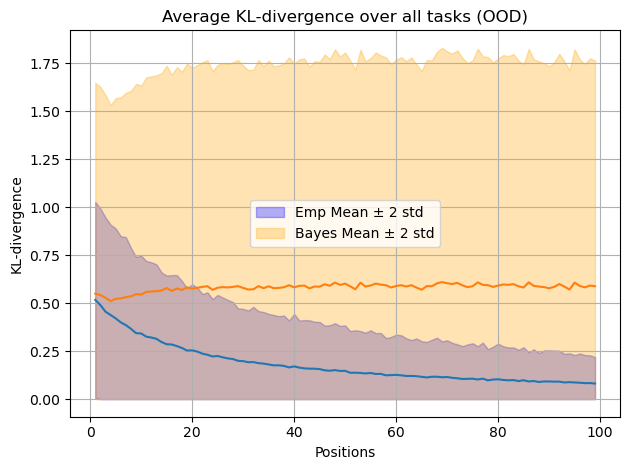

In [154]:
nu.bayes_emp_ood_plot(vocab_size=5, total_trans=40, alpha=0.5, seq_len=128,
                      num_samples=2000, low=1, high=100)

### Collect Metadata for Experiments

In [2]:
df = nu.extract_experiment_metadata()
df.head()

,vocab_size,alpha,total_transitions,seq_len,hidden_dim,stationary,filename
0,10,0.5,22,128,64,None,train_00582fce5d15d91fa3a23ac587fac5ee
1,5,0.5,27,256,64,True,train_0109403e0b1fa5383e0d3930cca46fbb
2,10,1.0,94,512,64,None,train_015236060332a7f5d8f317ce1ae083b1
3,10,1.0,20,512,64,None,train_01701be56d495a5359e34d4e8a6bad49
4,15,0.5,52,512,64,None,train_01d7dfeb6a8317ae3aa865b1aca122c9


## OOD: Number of Tasks vs Vocabulary Size

### Vocabulary size 5, $\alpha = 0.5$

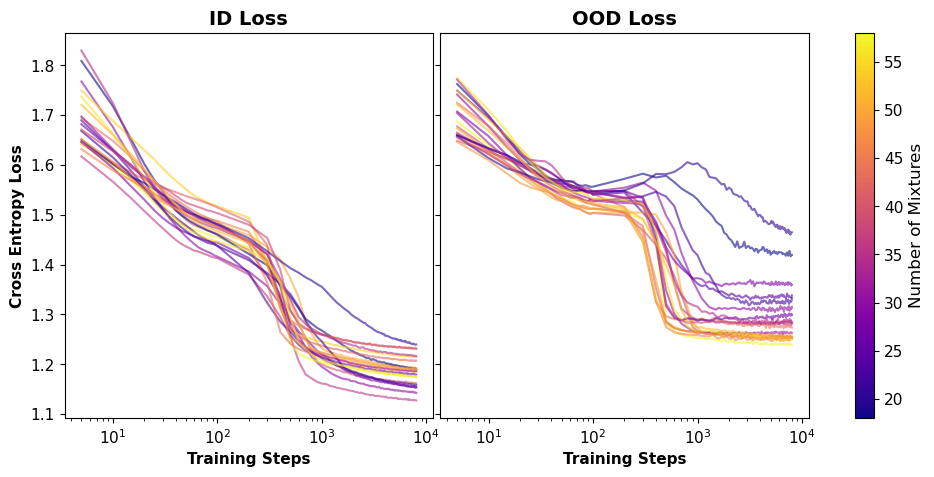

In [52]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(18,60), seq_len=128, alpha=0.5, hidden_dim=32)

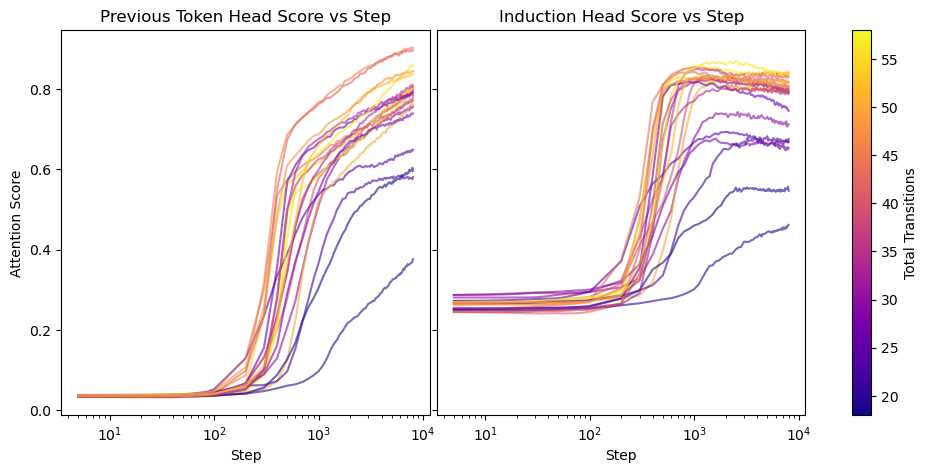

In [88]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(18,60), seq_len=128, alpha=0.5, hidden_dim=32)

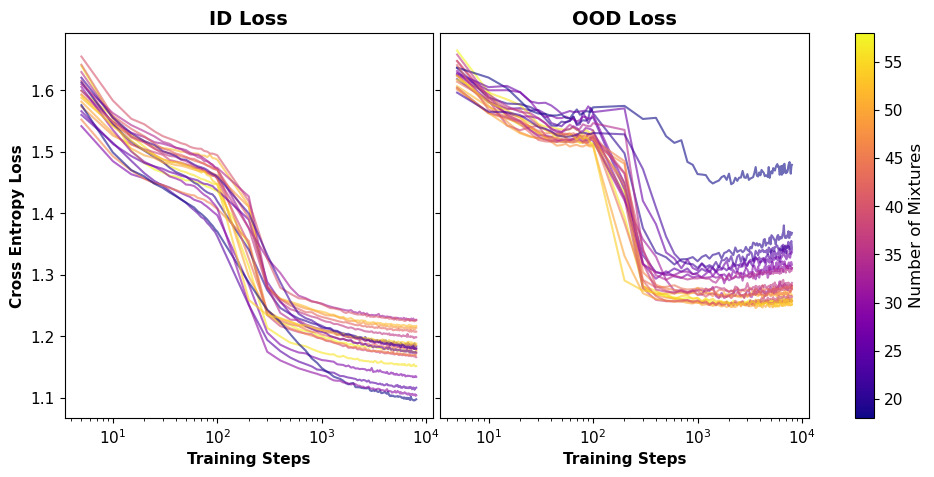

In [61]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(18,60), seq_len=128, alpha=0.5, hidden_dim=64)

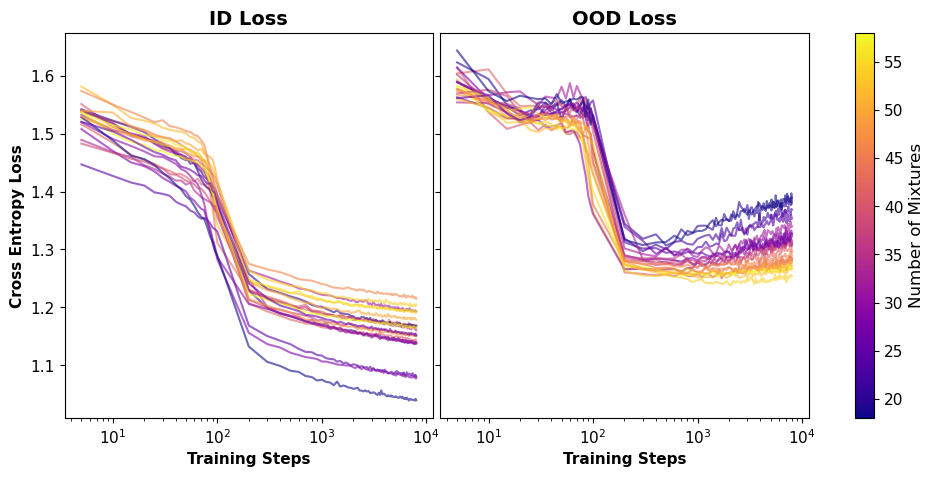

In [87]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(18,60), seq_len=128, alpha=0.5, hidden_dim=128)

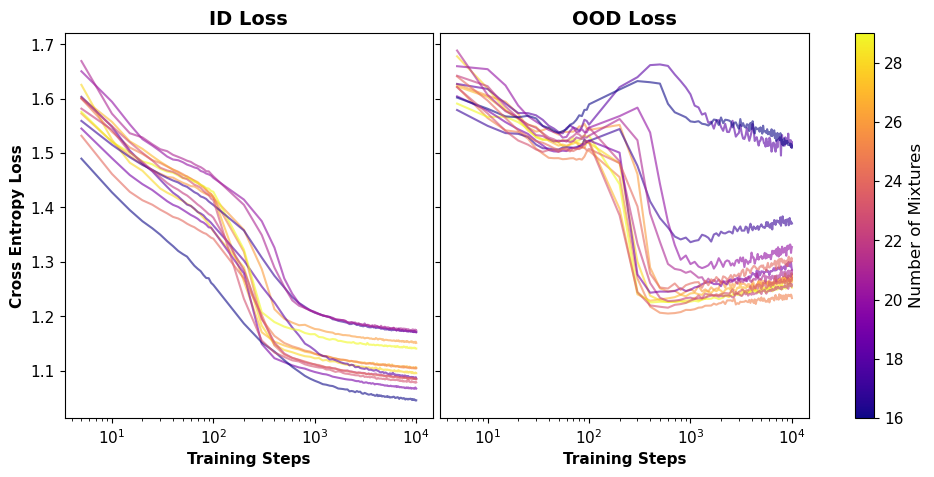

In [92]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(16,30), alpha=0.5, seq_len=256, stationary=False)

For 5 vocabularies, it needs roughly 18 chains to generalize OOD. This number does not seem to depend on the hidden dimension too much.

### Vocabulary size 10

When Vocabulary size is 10, it seems to require more chains for the transformer with embedding dimension 32 to generalize OOD. 
This is likely because it is harder for smaller transformer to develop induction heads.  

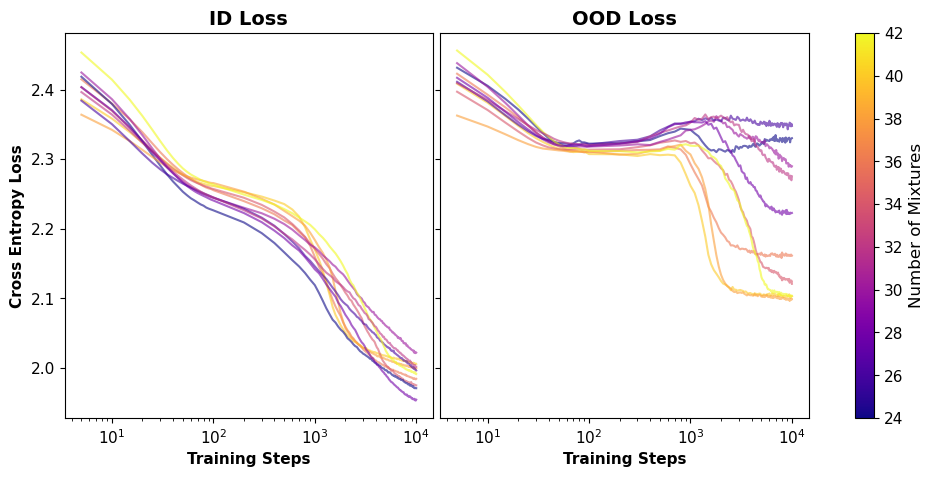

In [53]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(24,60), seq_len=128, alpha=0.5, hidden_dim=32)

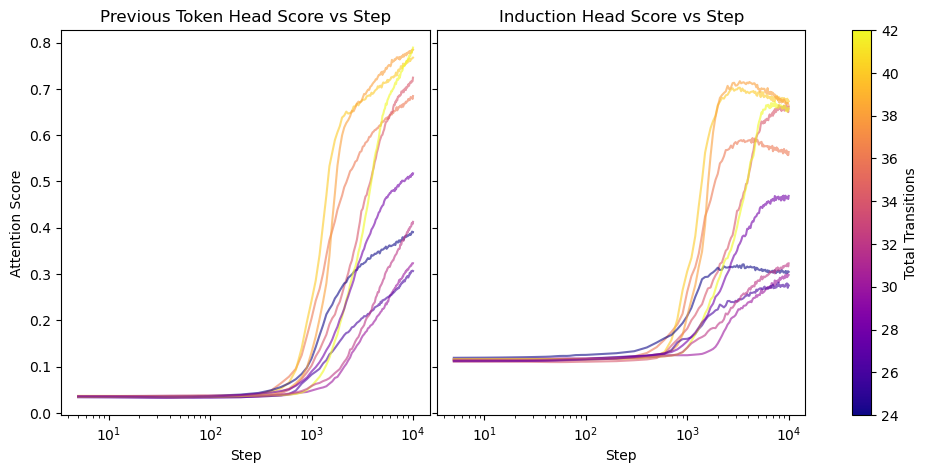

In [91]:
nu.get_attn_score_lineplot("latent", vocab_size=10, task_ids=np.arange(24,60), seq_len=128, alpha=0.5, hidden_dim=32)

For transformers with an embedding dimension larger than 64, it requires roughly 26 chains to generalize OOD.

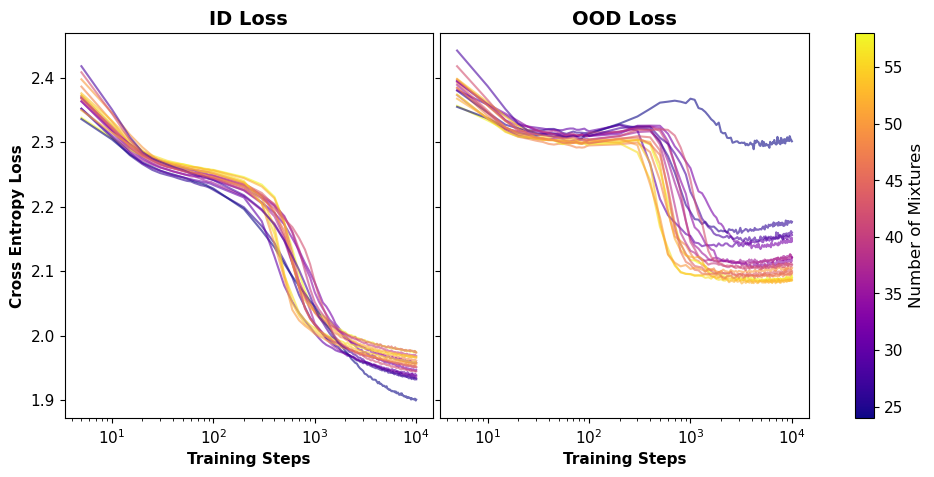

In [60]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(24,60), seq_len=128, alpha=0.5, hidden_dim=64)

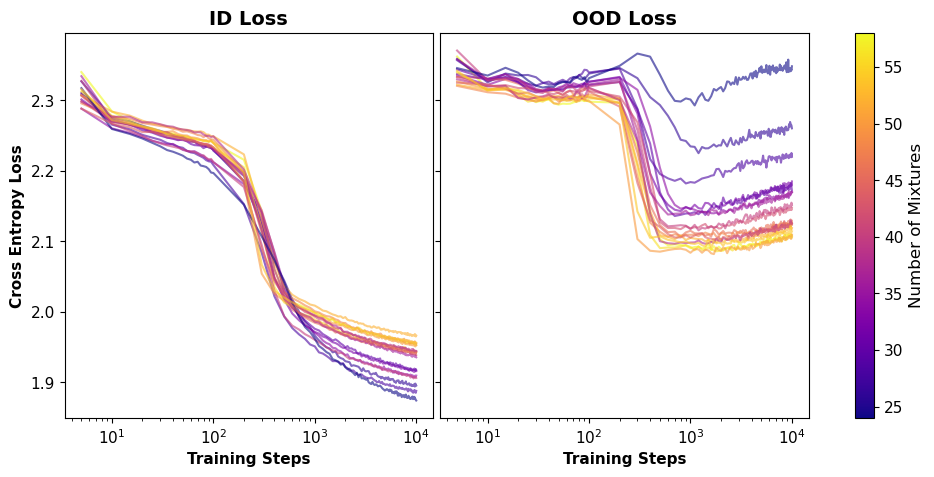

In [59]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(24,60), seq_len=128, alpha=0.5, hidden_dim=128)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 5

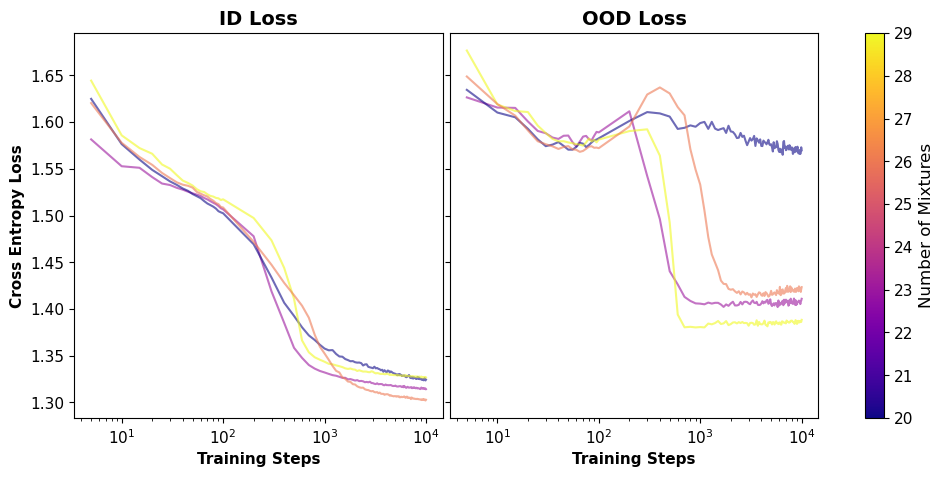

In [6]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(18,30), seq_len=512, alpha=1, hidden_dim=64)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 10

It requires roughly 44 chains.

Increasing $\alpha$ to 1 increases the number of chains required to generalize OOD. 

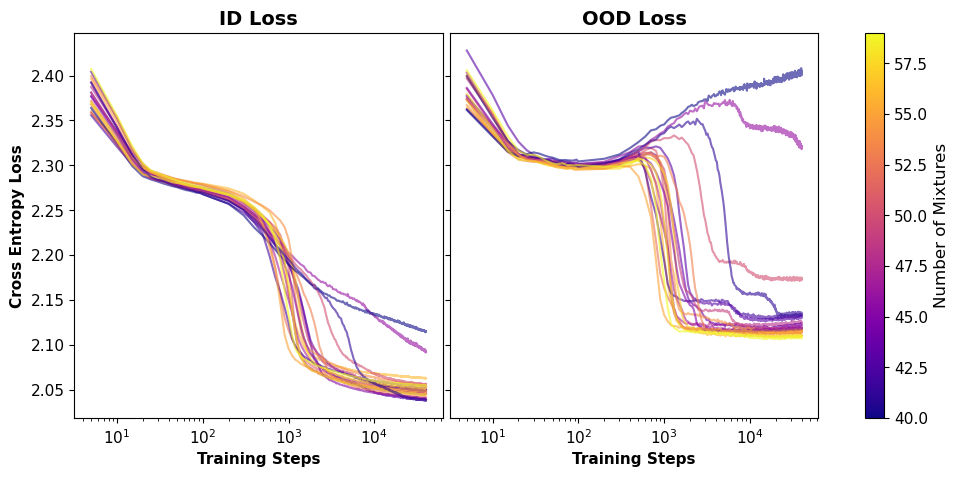

In [4]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(40,60), seq_len=512, alpha=1, hidden_dim=64)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 20

Double the vocabulary size requires roughly 74 chains.

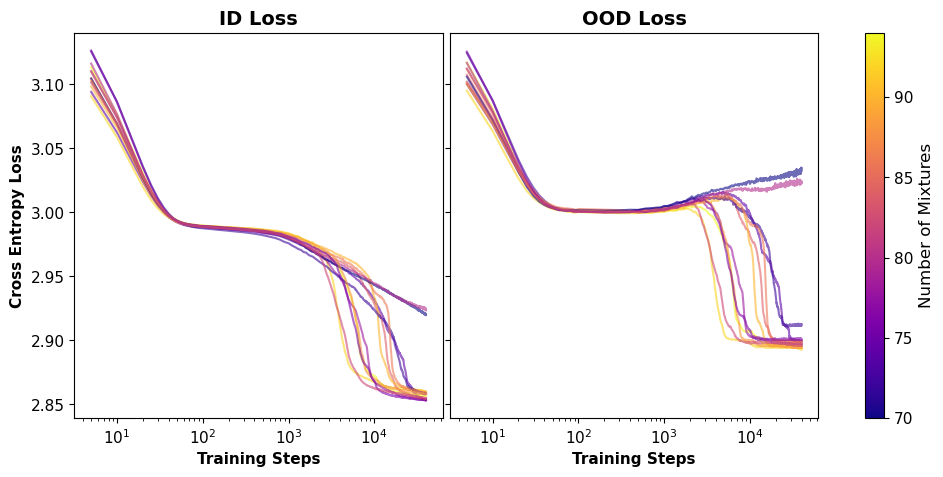

In [115]:
nu.get_loss_lineplot("latent", vocab_size=20, task_ids=np.arange(70,120), seq_len=512, alpha=1, hidden_dim=64)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 25


Requires roughly 96 chains

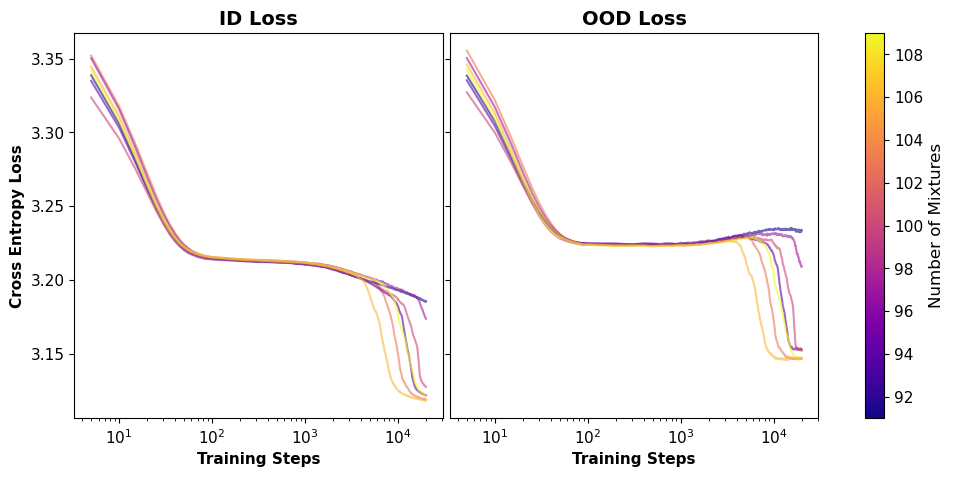

In [8]:
nu.get_loss_lineplot("latent", vocab_size=25, task_ids=np.arange(90,120), seq_len=512, alpha=1, hidden_dim=64)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 30

Increasing the vocabulary size to 30 requires roughly 108 chains. 

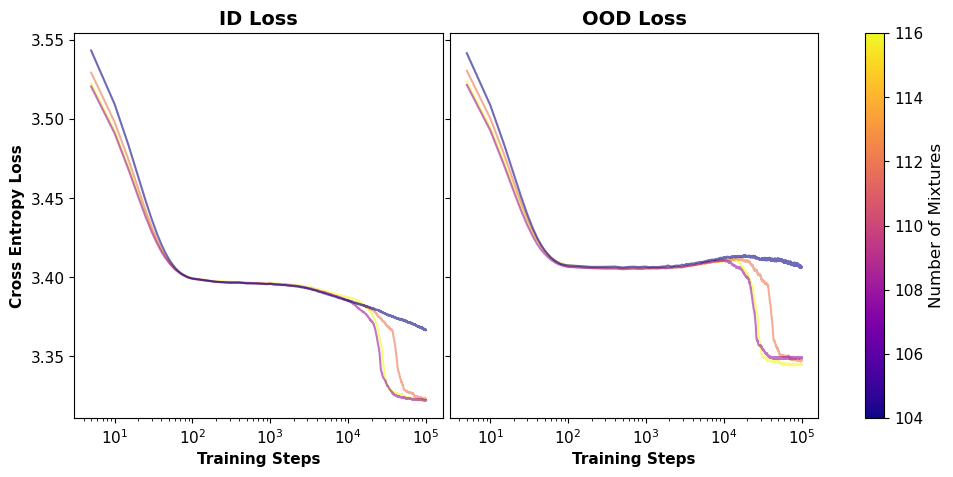

In [118]:
nu.get_loss_lineplot("latent", vocab_size=30, task_ids=np.arange(104,120), seq_len=512, alpha=1, hidden_dim=64)

## $\alpha = 1$, Embedding dimension being 64, Vocabulary size 60


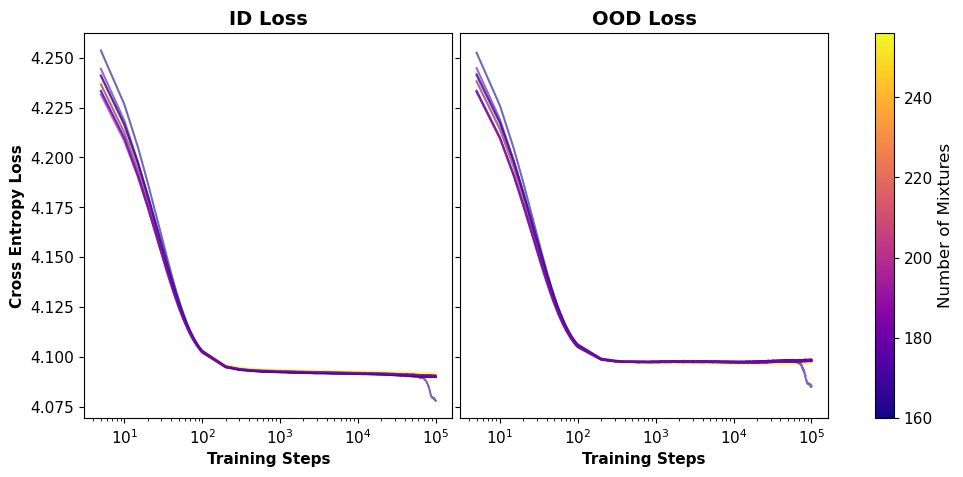

In [128]:
nu.get_loss_lineplot("latent", vocab_size=60, task_ids=np.arange(160,257), seq_len=512, alpha=1, hidden_dim=64)

## This Week TODO's:

- Understand the relation between vocabulary size and OOD generalization.

('You can choose from the following folders: '
 "['train_86c70e76ef0de90421afda393cfb17cd']")


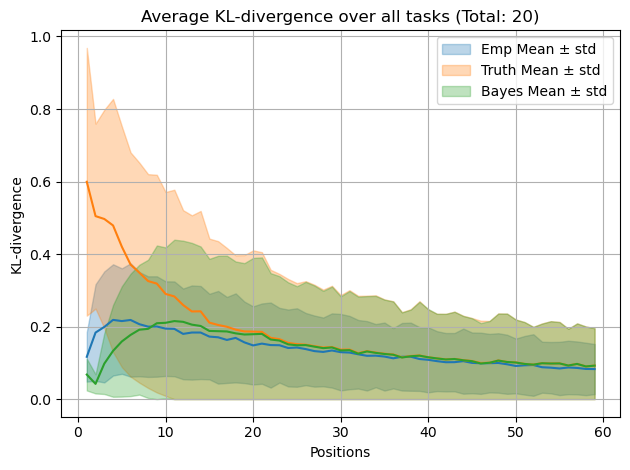

In [48]:
nu.all_kl_plot(vocab_size=5, total_trans=20, task=None, num_samples=1000, low=1, high=60, unif=False, unigram=False,
               seq_len=64, alpha=0.5, hidden_dim=32)

('You can choose from the following folders: '
 "['train_5a070bd4ff2ab73ffce25046062bf5cc']")


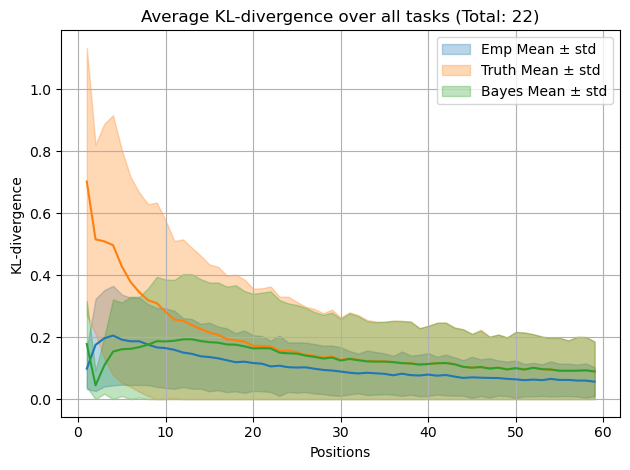

In [56]:
nu.all_kl_plot(vocab_size=5, total_trans=22, task=None, num_samples=1000, low=1, high=60, unif=False, unigram=False,
               seq_len=64, alpha=0.5, hidden_dim=32)

('You can choose from the following folders: '
 "['train_5a070bd4ff2ab73ffce25046062bf5cc']")


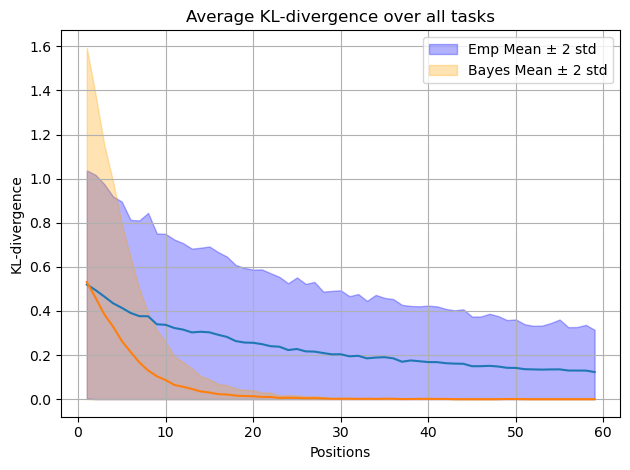

In [57]:
nu.bayes_emp_plot(vocab_size=5, total_trans=22, task=None, num_samples=1000, low=1, high=60, unigram=False,
                  seq_len=64, alpha=0.5, hidden_dim=32)

ValueError: min() iterable argument is empty

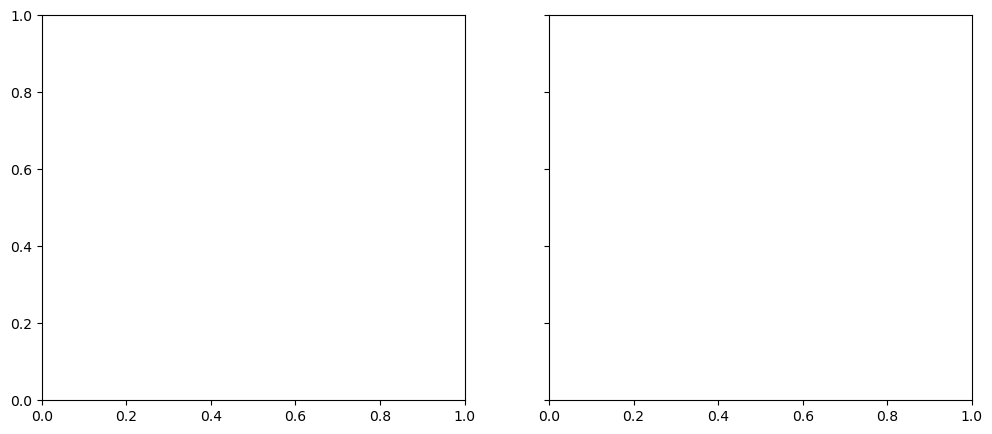

In [81]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(16,61), alpha=0.1, seq_len=64, hidden_dim=64)

('You can choose from the following folders: '
 "['train_b2f6d26c6caf66c1613cd1d060e483c7']")


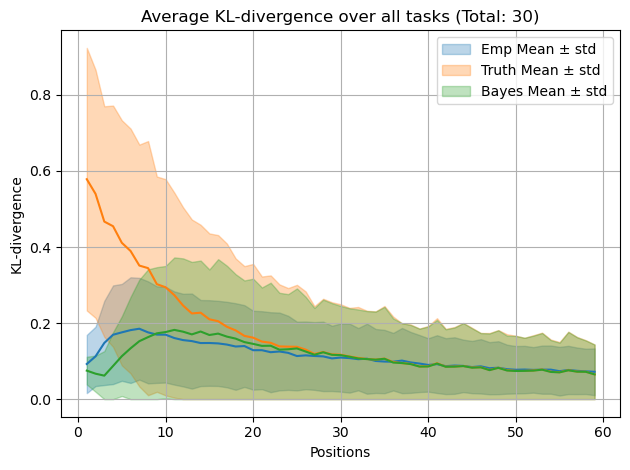

In [77]:
nu.all_kl_plot(vocab_size=5, total_trans=30, task=None, num_samples=1000, low=1, high=60, unif=False, unigram=False,
               seq_len=64, alpha=0.5, hidden_dim=256)

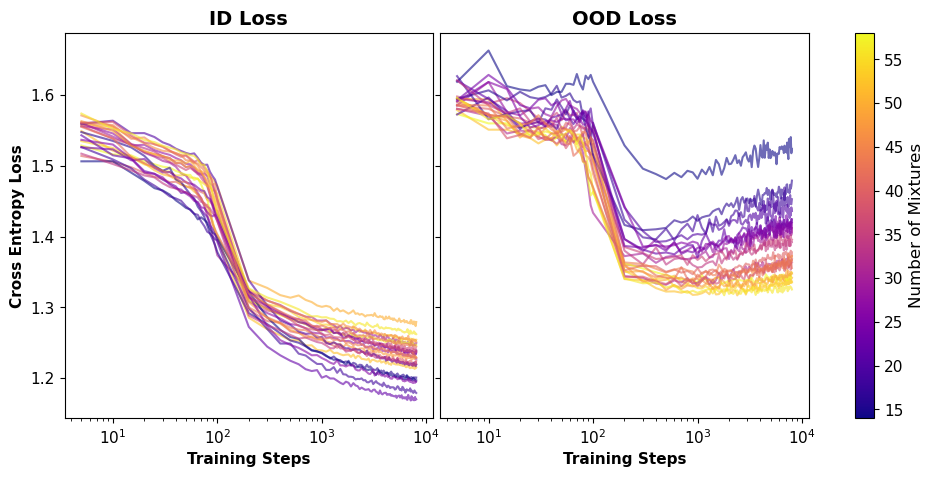

In [71]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=128)

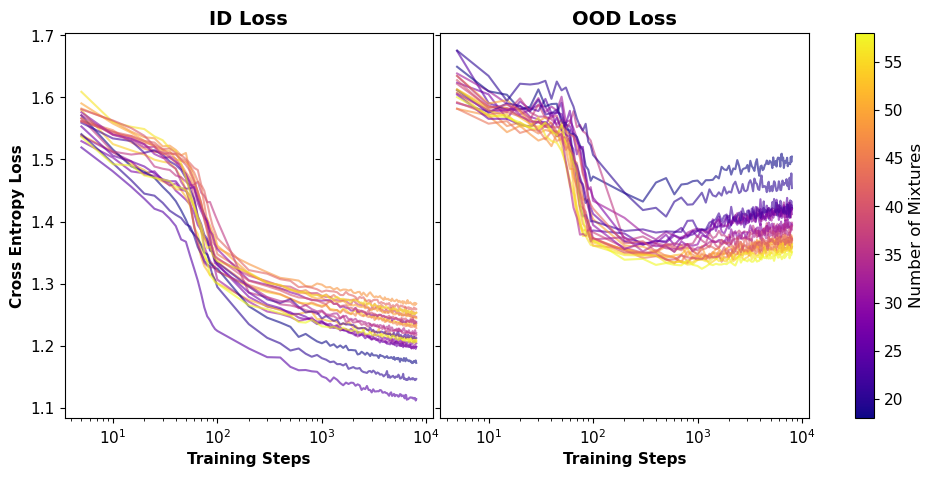

In [73]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(18,61), alpha=0.5, seq_len=64, hidden_dim=256)

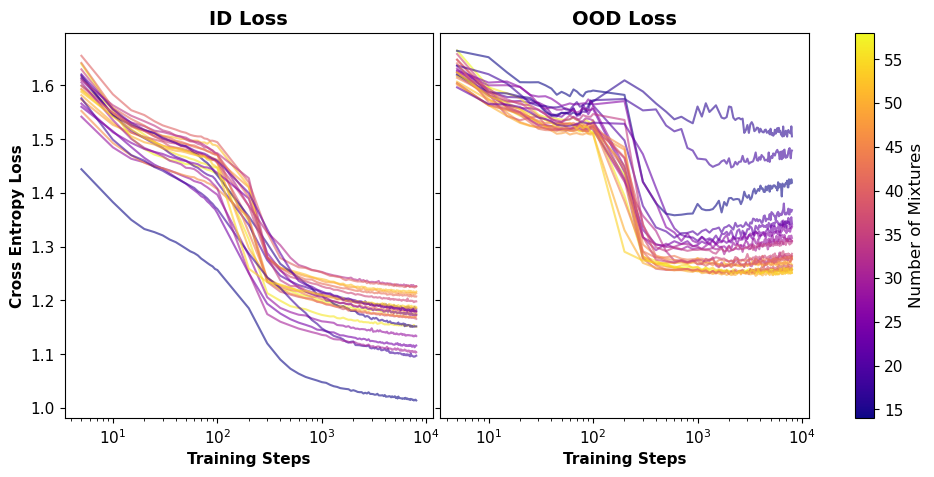

In [125]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=64)

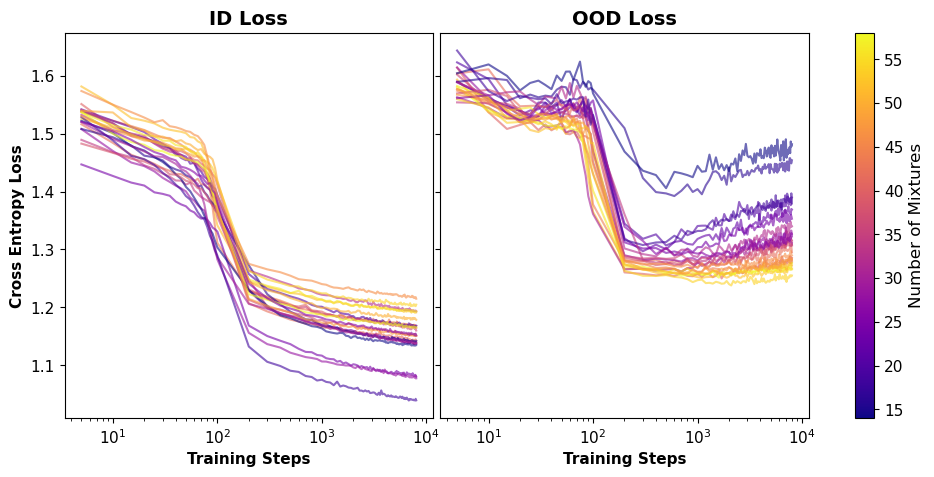

In [78]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=128)

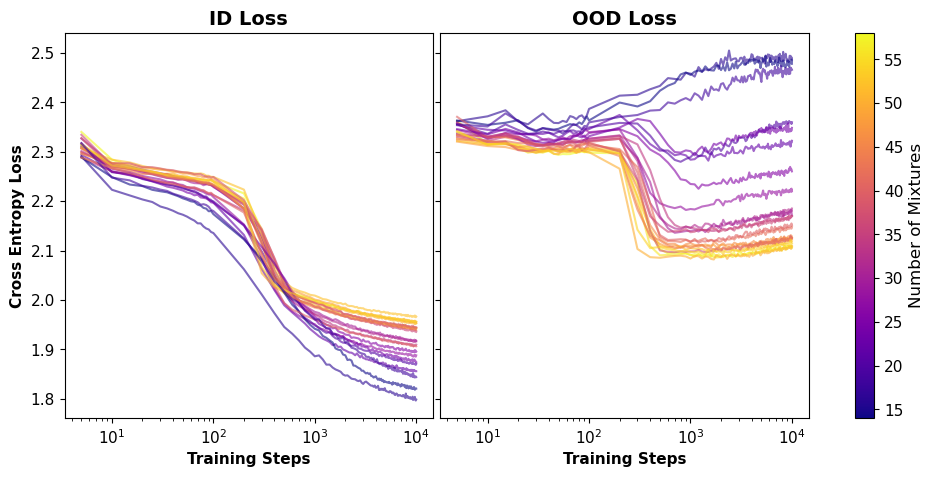

In [4]:
nu.get_loss_lineplot("latent", vocab_size=10, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=128)

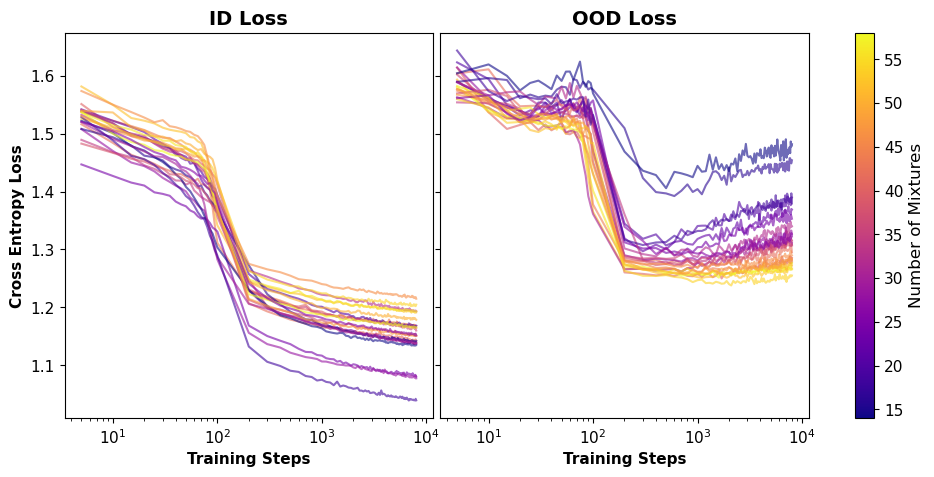

In [136]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=128)

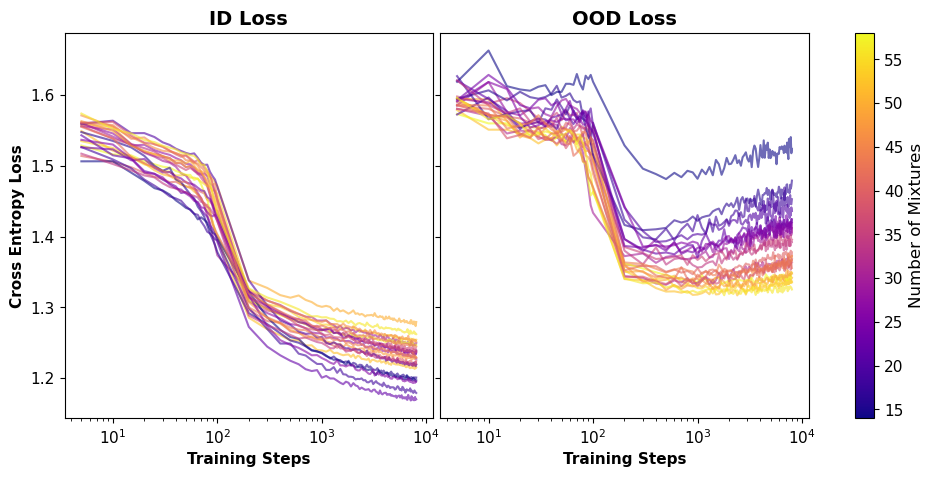

In [106]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=128)

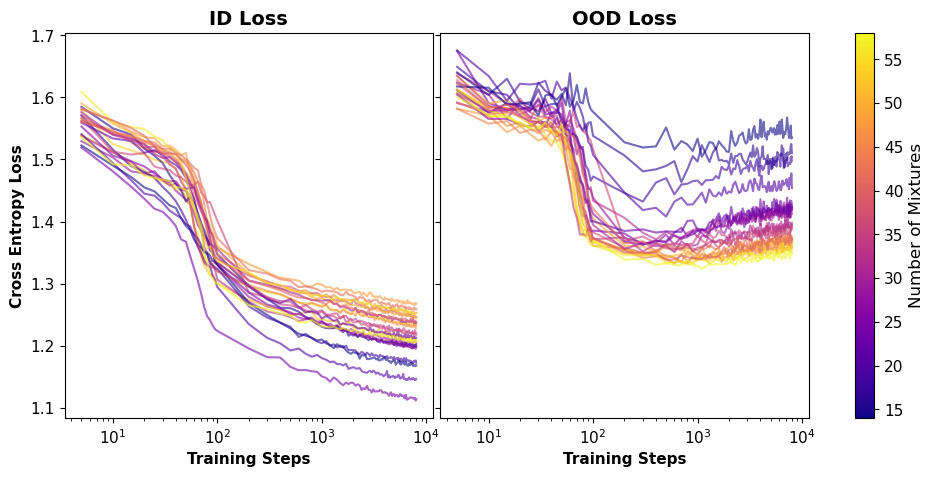

In [108]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=256)

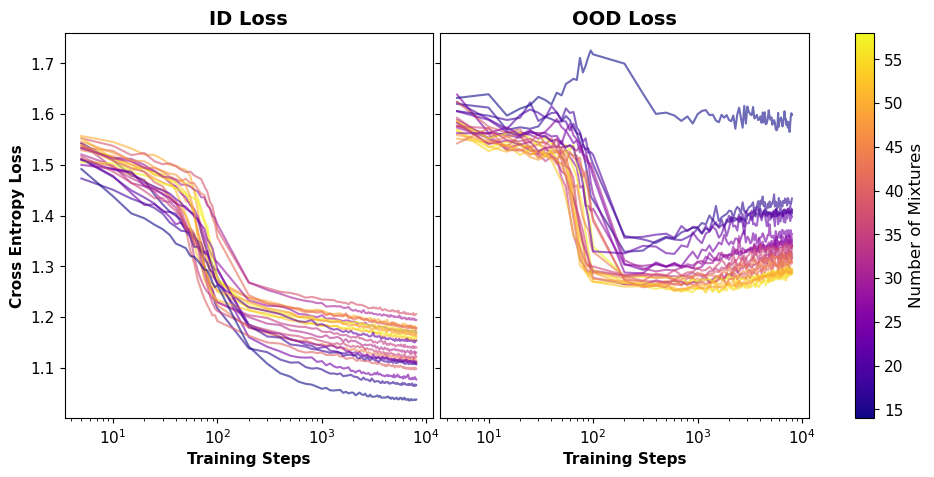

In [137]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=256)

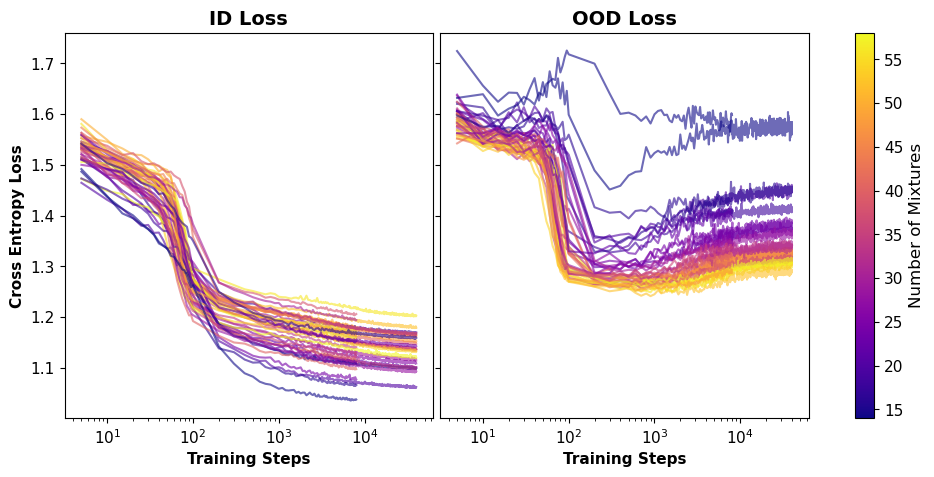

In [145]:
nu.get_loss_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=128, hidden_dim=256)

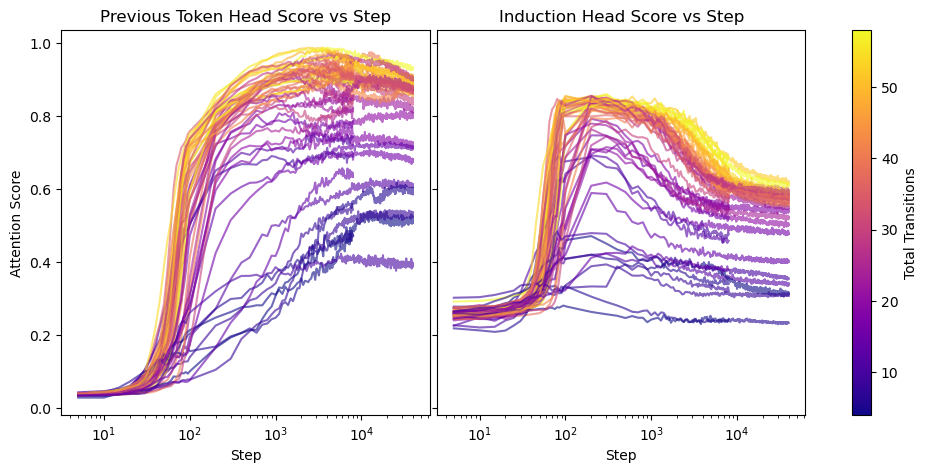

In [148]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(4,61), alpha=0.5, seq_len=128, hidden_dim=256)

('You can choose from the following folders: '
 "['train_6395fe17ff02eb0652e752a6cdac19a2', "
 "'train_df5db19ebb4e12bb2d4bd9e88aab99e0']")


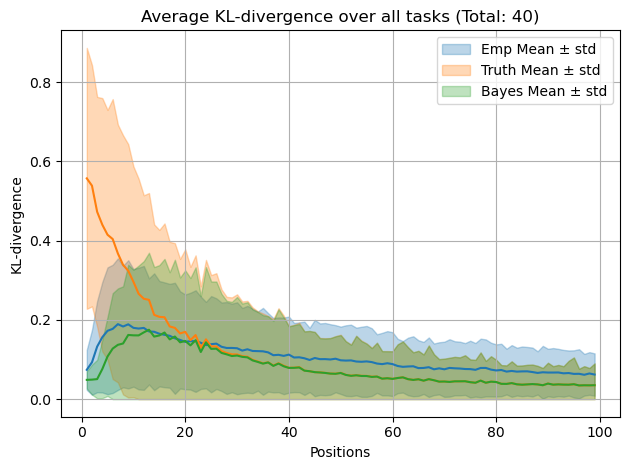

In [147]:
nu.all_kl_plot(vocab_size=5, total_trans=40, task=None, num_samples=1000, low=1, high=100, unif=False, 
               seq_len=128, alpha=0.5, hidden_dim=256)

('You can choose from the following folders: '
 "['train_9b595b9f099865d8717bf41e5ed50e8a']")


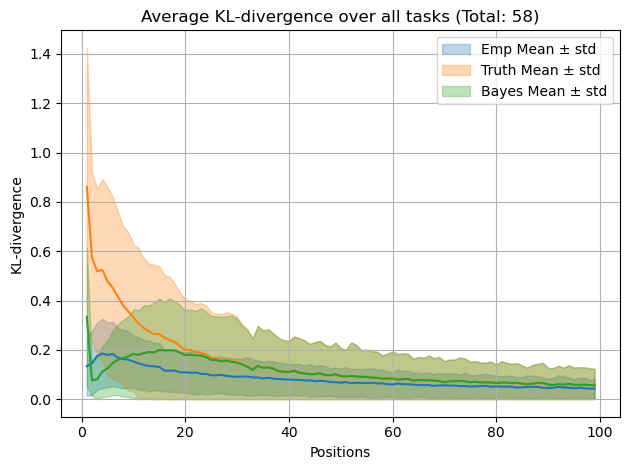

In [143]:
nu.all_kl_plot(vocab_size=5, total_trans=58, task=None, num_samples=1000, low=1, high=100, unif=False, 
               seq_len=128, alpha=0.5, hidden_dim=256)

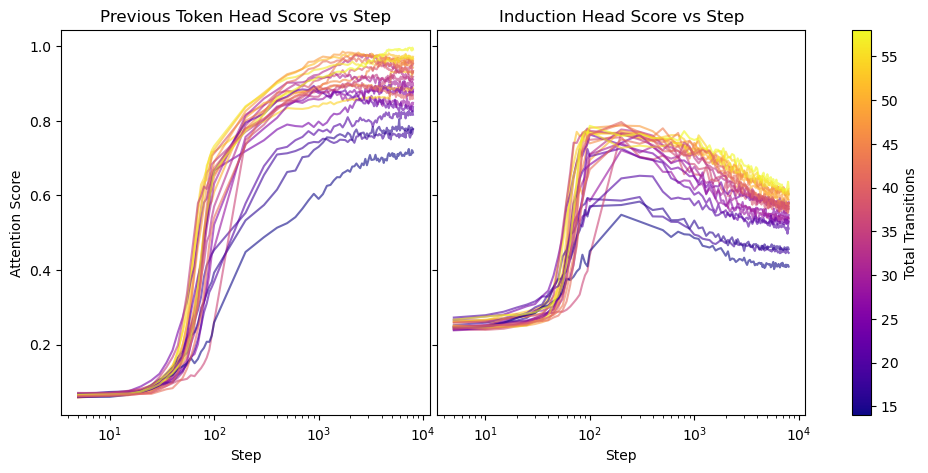

In [109]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=256)

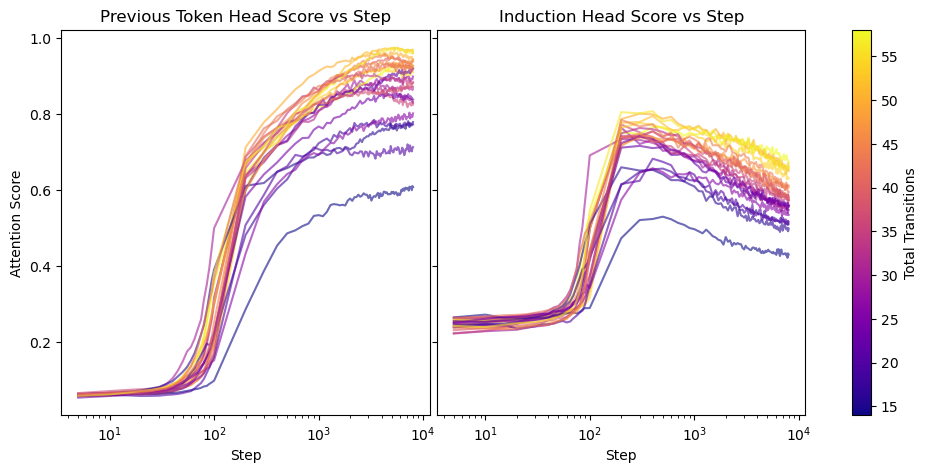

In [110]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=128)

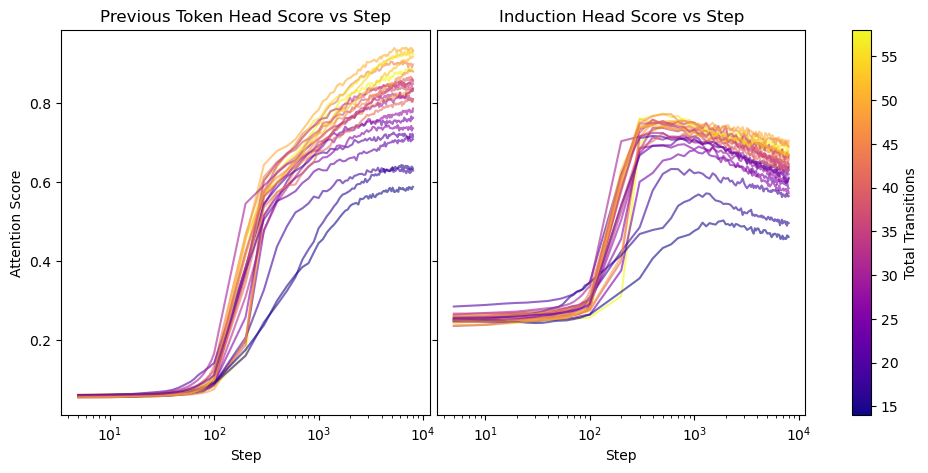

In [111]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=64)

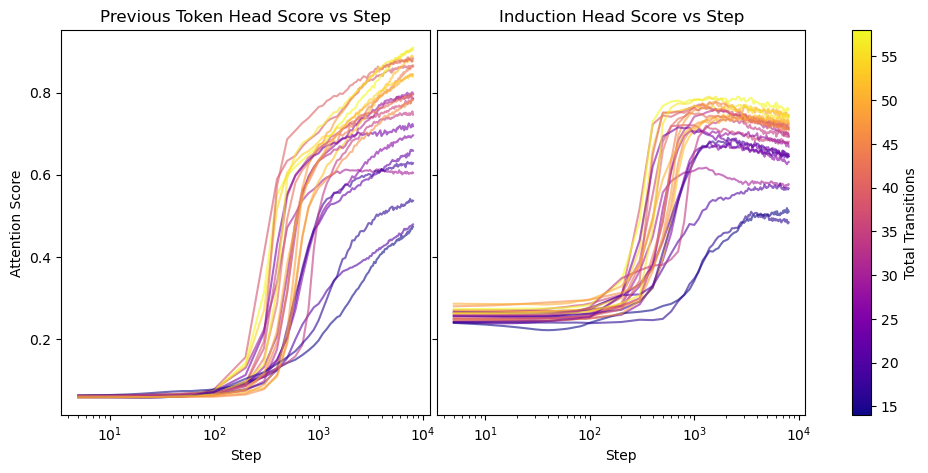

In [112]:
nu.get_attn_score_lineplot("latent", vocab_size=5, task_ids=np.arange(14,61), alpha=0.5, seq_len=64, hidden_dim=32)

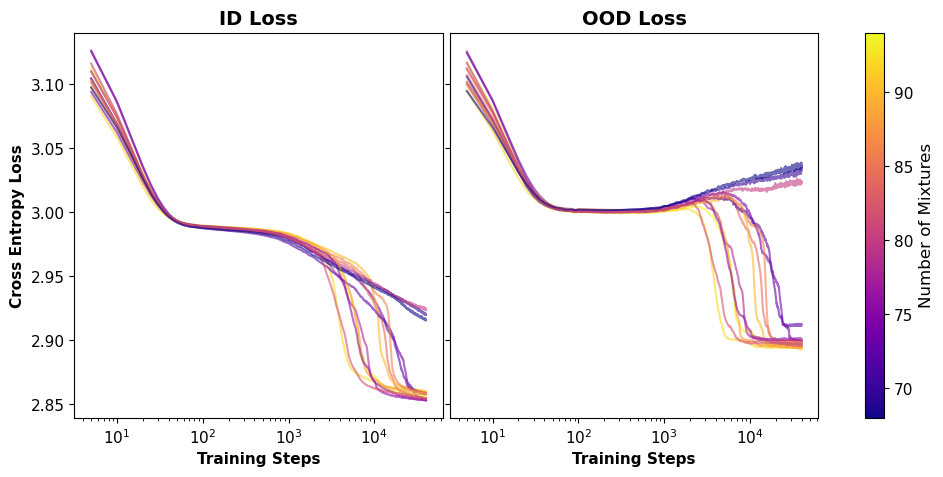

In [11]:
nu.get_loss_lineplot("latent", vocab_size=20, task_ids=np.arange(68,129), alpha=1)

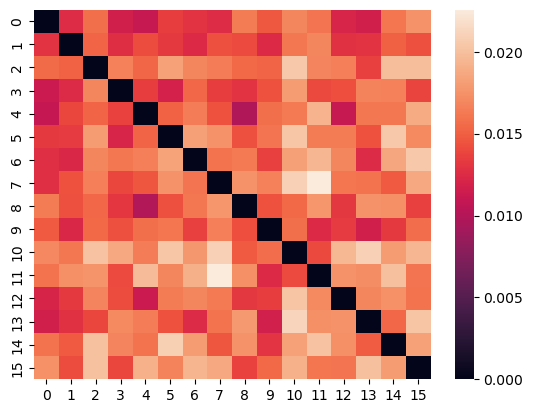

In [140]:
kld_uni = np.zeros((sampler.total_trans, sampler.total_trans))
stationary = torch.zeros((sampler.total_trans, config.vocab_size))
for i in range(sampler.total_trans):
    stationary[i] = lau.get_stationary(sampler.trans_mat[i])
for i in range(sampler.total_trans):
    for j in range(sampler.total_trans):
        kld_uni[i][j] = F.kl_div(stationary[i].log(), stationary[j], reduction="none").sum(dim=-1)
sns.heatmap(kld_uni)
plt.show()

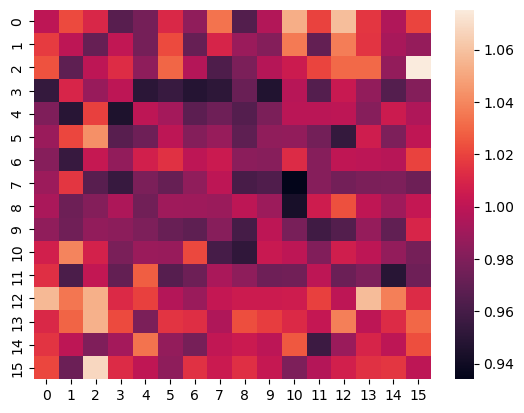

In [141]:
kld_ave = np.ones((sampler.total_trans, sampler.total_trans))
for i in range(sampler.total_trans):
    for j in range(sampler.total_trans):
        if i != j:
            kld_ave[i][j] = (F.kl_div(sampler.trans_mat[i].log(), 
                                      sampler.trans_mat[j], reduction="none").sum(dim=-1) * stationary[j].to("cuda")).sum(dim=-1).cpu().item()
sns.heatmap(kld_ave)
plt.show()

In [93]:
def get_tok_task_represent(model, sampler, tok, task, pos=450, num_samples=15):
    batch, _ = sampler.generate(task=task, mode="testing", num_samples=num_samples)
    batch[:,pos] = tok
    tokens = model.embed(batch)
    hidden = model.layers[0](tokens, False)[0]
    hidden = model.layers[1](tokens, False)[0]
    tv = hidden[:,pos].mean(dim=0)
    return tv.detach().cpu()

In [94]:
tv = torch.zeros((sampler.total_trans, config.vocab_size, config.model.emb_dim))
for i in range(config.vocab_size):
    for task in range(sampler.total_trans):
        tv[task, i] = get_tok_task_represent(model, sampler, tok=i, task=task)

for i in range(config.vocab_size):
    for j in range(i+1, config.vocab_size):
        tv_diff = tv[:, i] - tv[:, j]
        normed = F.normalize(tv_diff, p=2, dim=1)  # each row is now unit length
        
        cos_sim_matrix = normed @ normed.T
    
        min_diffs[i][j] = np.min(cos_sim_matrix.numpy())
        ave_diffs[i][j] = np.mean(cos_sim_matrix.numpy())
        min_diffs[j][i] = min_diffs[i][j]
        ave_diffs[j][i] = ave_diffs[i][j]

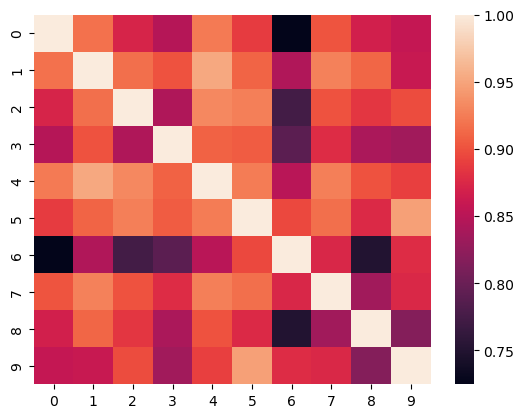

In [96]:
sns.heatmap(min_diffs)
plt.show()

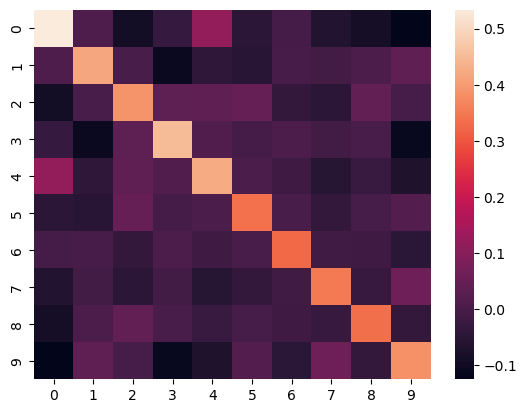

In [36]:
sns.heatmap((model.output_layer.weight @ model.output_layer.weight.T).detach().cpu().numpy())
plt.show()

In [31]:
torch.linalg.svdvals(model.output_layer.weight)

tensor([0.856, 0.786, 0.692, 0.649, 0.601, 0.566, 0.558, 0.509, 0.498, 0.441],
       device='cuda:0', grad_fn=<LinalgSvdBackward0>)

In [ ]:
def get_single_task_vector_latent(model, task, seq_len, hidden_size, act_type="attn1", num_samples=50):
    batch, _ = sampler.generate(task=task, mode="testing", num_samples=num_samples)
    tokens = model.embed(batch)
    if act_type == "attn0":
        hidden = model.layers[0].MHA(tokens, False)[0]
        return hidden.mean(dim=0).detach().cpu().numpy()
    tokens = model.layers[0](tokens)[0]
    if act_type == "layer0":
        return tokens.mean(dim=0).detach().cpu().numpy()
    
    hidden1 = model.layers[1].MHA(tokens, False)[0]
    if act_type == "attn1":
        return hidden1.mean(dim=0).detach().cpu().numpy()
    hidden1 = model.layers[1].mlp(tokens + hidden1)
    if act_type == "mlp1":
        return hidden1.mean(dim=0).detach().cpu().numpy()
    

def get_task_vector_ind(model, latent, seq_len, voc_size, hidden_size, pos=80, B=50):
    task_vec = torch.zeros((voc_size, hidden_size)).to("cuda")
    for b in range(B):
        batch, _ = sampler.test(latent=latent)
        for k in range(voc_size):
            batch[0][pos] = k
            tokens = model.embed(batch)
            tokens = model.layers[0](tokens)[0]
            hidden1 = model.layers[1].MHA(tokens, False)[0]
            task_vec[k] += hidden1[0][pos]
    return task_vec.detach().cpu().numpy() / B

def moving_average(arr, window_size):
    return np.convolve(arr, np.ones(window_size)/window_size, mode='valid')


def hidden_injection(batch, model, task_vec, act_type, pos=80):
    batch_size, seq_len = batch.shape
    tokens = model.embed(batch)
    task_vec = torch.from_numpy(task_vec).to("cuda")
    if pos is not None:
        task_vec = task_vec[pos:].mean(axis=0)
    if act_type == "mlp1":
        tokens += task_vec
    elif act_type == "attn1":
        tokens += task_vec
        tokens += model.layers[1].mlp(tokens)
    elif act_type == "mlp0":
        tokens += task_vec
        Q = model.layers[1].MHA.query(tokens).view(batch_size, seq_len, 1, 128).transpose(1,2) # (B,H,T,D)
        K = model.layers[1].MHA.key(tokens).view(batch_size, seq_len, 1, 128).transpose(1,2)
        V = model.layers[1].MHA.value(tokens).view(batch_size, seq_len, 1, 128).transpose(1,2)
        T = Q.size(2)
        # expected shape for apply_rotary_emb: (batch_size, max_seq_len, num_head, d_head)
        Q, K = apply_rotary_emb(Q.transpose(1, 2), K.transpose(1, 2), freqs_cis=model.layers[1].MHA.freqs_cis[:T])
        Q, K = Q.transpose(1, 2), K.transpose(1, 2)
        attn_score = Q @ K.transpose(-1,-2) / model.layers[1].MHA.scale
        attn = F.softmax(attn_score, dim=-1)

        diag_mask = torch.eye(T, dtype=tokens.dtype, device=tokens.device)  # Shape: (T, T)

        # Expand mask to match (B, H, T, T) using broadcasting
        diag_mask = diag_mask.unsqueeze(0).unsqueeze(0)  # Shape: (1, 1, T, T)
        
        # Apply the mask
        attn = attn * diag_mask
        out = attn @ V
        out = model.layers[1].MHA.out(out)
        tokens += out[0]
        tokens += model.layers[1].mlp(tokens)[0]
    else:
        tokens += task_vec
        tokens += model.layers[0].mlp(tokens)
        Q = model.layers[1].MHA.query(tokens).view(1, seq_len, 1, 128).transpose(1,2) # (B,H,T,D)
        K = model.layers[1].MHA.key(tokens).view(1, seq_len, 1, 128).transpose(1,2)
        V = model.layers[1].MHA.value(tokens).view(1, seq_len, 1, 128).transpose(1,2)
        T = Q.size(2)
        # expected shape for apply_rotary_emb: (batch_size, max_seq_len, num_head, d_head)
        Q, K = apply_rotary_emb(Q.transpose(1, 2), K.transpose(1, 2), freqs_cis=model.layers[1].MHA.freqs_cis[:T])
        Q, K = Q.transpose(1, 2), K.transpose(1, 2)
        attn_score = Q @ K.transpose(-1,-2) / model.layers[1].MHA.scale
        attn = F.softmax(attn_score, dim=-1)

        diag_mask = torch.eye(T, dtype=tokens.dtype, device=tokens.device)  # Shape: (T, T)

        # Expand mask to match (B, H, T, T) using broadcasting
        diag_mask = diag_mask.unsqueeze(0).unsqueeze(0)  # Shape: (1, 1, T, T)
        
        # Apply the mask
        attn = attn * diag_mask
        out = attn @ V
        out = model.layers[1].MHA.out(out)
        tokens += out[0]
        tokens += model.layers[1].mlp(tokens)[0]
    probs = nn.Softmax(dim=-1)(model.output_layer(tokens))
    return probs

def no_context(batch, model):
    tokens = model.embed(batch)
    tokens += model.layers[0].mlp(tokens)
    tokens += model.layers[1].mlp(tokens)
    probs = nn.Softmax(dim=-1)(model.output_layer(tokens))
    return probs

def hidden_injection_ind(batch, model, task_vec):
    tokens = model.embed(batch)
    task_vec = torch.from_numpy(task_vec).to("cuda")
    task_vec = task_vec[batch[0]]
    tokens += task_vec
    tokens += model.layers[1].mlp(tokens)
    probs = nn.Softmax(dim=-1)(model.output_layer(tokens))
    return probs

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def task_loss_plot(model, sampler, SEQ_LEN, latent, other, act_type, B=20, R=50):
    task_vecs = get_task_vector(model, other, SEQ_LEN, 128, act_type=act_type, B=R)

    kl_losses = np.zeros((B, SEQ_LEN))
    kl_losses_no_injection = np.zeros((B, SEQ_LEN))
    no_context_losses = np.zeros((B, SEQ_LEN))
    origin_losses = np.zeros((B, SEQ_LEN))
    
    for b in range(B):
        batch, _ = sampler.test(latent=latent)
        kl_loss_no_injection = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), nn.Softmax(dim=-1)(model(batch)[0])[0], reduction="none").sum(dim=-1)
        origin_loss = F.kl_div(sampler.trans_matrix[latent][batch[0]].log(), nn.Softmax(dim=-1)(model(batch)[0])[0], reduction="none").sum(dim=-1)
        
        kl_loss = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), hidden_injection(batch, model, task_vecs, act_type)[0], reduction="none").sum(dim=-1)
        
        no_context_prob = no_context(batch, model)
        no_context_loss = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), no_context(batch, model)[0], reduction="none").sum(dim=-1)
        
        kl_losses[b] = kl_loss.detach().cpu().numpy() 
        no_context_losses[b] = no_context_loss.detach().cpu().numpy()
        origin_losses[b] = origin_loss.detach().cpu().numpy()
        kl_losses_no_injection[b] = kl_loss_no_injection.detach().cpu().numpy()
    
    arr = np.arange(len(kl_loss))
    
    mean_losses_o = np.mean(origin_losses, axis=0)
    std_losses_o = np.std(origin_losses, axis=0)
    
    mean_losses = np.mean(kl_losses, axis=0)
    std_losses = np.std(kl_losses, axis=0)
    
    mean_losses_no = np.mean(kl_losses_no_injection, axis=0)
    std_losses_no = np.std(kl_losses_no_injection, axis=0)
    
    mean_losses_no_c = np.mean(no_context_losses, axis=0)
    std_losses_no_c = np.std(no_context_losses, axis=0)
    
    # Plot the array
    plt.plot(arr, mean_losses)
    plt.fill_between(arr, np.maximum(mean_losses - std_losses, 0), mean_losses + std_losses, alpha=0.2, label="Task Vector")
    
    plt.plot(arr, mean_losses_no)
    plt.fill_between(arr, np.maximum(mean_losses_no - std_losses_no, 0), mean_losses_no + std_losses_no, alpha=0.2, label="Wrong Label")
    
    plt.plot(arr, mean_losses_o)
    plt.fill_between(arr, np.maximum(mean_losses_o - std_losses_o, 0), mean_losses_o + std_losses_o, alpha=0.2, label="Original")
    
    plt.plot(arr, mean_losses_no_c)
    plt.fill_between(arr, np.maximum(mean_losses_no_c - std_losses_no_c, 0), mean_losses_no_c + std_losses_no_c, alpha=0.2, label="No Context")
    
    plt.grid()
    plt.legend()
    plt.title("Average KL-divergence at different positions")
    plt.xlabel("Positions")
    plt.ylabel("KL-divergence")
    
    plt.show()


def task_loss_plot_ind(model, sampler, SEQ_LEN, voc_size, latent, other, B=20, R=50, pos=80):
    task_vecs = get_task_vector_ind(model, latent=other, seq_len=SEQ_LEN, voc_size=voc_size, hidden_size=128, pos=pos, B=R)

    kl_losses = np.zeros((B, SEQ_LEN))
    kl_losses_no_injection = np.zeros((B, SEQ_LEN))
    no_context_losses = np.zeros((B, SEQ_LEN))
    origin_losses = np.zeros((B, SEQ_LEN))
    
    for b in range(B):
        batch, _ = sampler.test(latent=latent)
        kl_loss_no_injection = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), 
                                        nn.Softmax(dim=-1)(model(batch)[0])[0], reduction="none").sum(dim=-1)
        origin_loss = F.kl_div(sampler.trans_matrix[latent][batch[0]].log(), 
                               nn.Softmax(dim=-1)(model(batch)[0])[0], reduction="none").sum(dim=-1)
        
        kl_loss = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), 
                           hidden_injection_ind(batch, model, task_vecs)[0], reduction="none").sum(dim=-1)
        
        no_context_prob = no_context(batch, model)
        no_context_loss = F.kl_div(sampler.trans_matrix[other][batch[0]].log(), no_context(batch, model)[0], reduction="none").sum(dim=-1)
        
        kl_losses[b] = kl_loss.detach().cpu().numpy() 
        no_context_losses[b] = no_context_loss.detach().cpu().numpy()
        origin_losses[b] = origin_loss.detach().cpu().numpy()
        kl_losses_no_injection[b] = kl_loss_no_injection.detach().cpu().numpy()
    
    arr = np.arange(len(kl_loss))
    
    mean_losses_o = np.mean(origin_losses, axis=0)
    std_losses_o = np.std(origin_losses, axis=0)
    
    mean_losses = np.mean(kl_losses, axis=0)
    std_losses = np.std(kl_losses, axis=0)
    
    mean_losses_no = np.mean(kl_losses_no_injection, axis=0)
    std_losses_no = np.std(kl_losses_no_injection, axis=0)
    
    mean_losses_no_c = np.mean(no_context_losses, axis=0)
    std_losses_no_c = np.std(no_context_losses, axis=0)
    
    # Plot the array
    plt.plot(arr, mean_losses)
    plt.fill_between(arr, np.maximum(mean_losses - std_losses, 0), mean_losses + std_losses, alpha=0.2, label="Task Vector")
    
    plt.plot(arr, mean_losses_no)
    plt.fill_between(arr, np.maximum(mean_losses_no - std_losses_no, 0), mean_losses_no + std_losses_no, alpha=0.2, label="Wrong Label")
    
    plt.plot(arr, mean_losses_o)
    plt.fill_between(arr, np.maximum(mean_losses_o - std_losses_o, 0), mean_losses_o + std_losses_o, alpha=0.2, label="Original")
    
    plt.plot(arr, mean_losses_no_c)
    plt.fill_between(arr, np.maximum(mean_losses_no_c - std_losses_no_c, 0), mean_losses_no_c + std_losses_no_c, alpha=0.2, label="No Context")
    
    plt.grid()
    plt.legend()
    plt.title("Average KL-divergence at different positions")
    plt.xlabel("Positions")
    plt.ylabel("KL-divergence")
    
    plt.show()

def task_vec_diff_viz(model, act_type, SEQ_LEN, latents, ws=2):
    ws = ws
    for l in range(latents):
        task_vecs = get_task_vector(model, l, SEQ_LEN, 128, act_type=act_type, B=50)
        diff_norm = np.linalg.norm(task_vecs[1:] - task_vecs[:-1], axis=1) / np.linalg.norm(task_vecs[1:], axis=1)
        arr = np.arange(len(diff_norm)-ws+1)
        plt.plot(arr, moving_average(diff_norm, ws), label=f"Difference when latent is {l}")
    
    plt.title("Relative Scales")
    plt.legend()
    plt.show()

def task_vec_sim_viz(model, act_type, SEQ_LEN, latents, ws=2):
    ws = ws
    if latents == 2:
        task_vecs0 = get_task_vector(model, 0, SEQ_LEN, 128, act_type=act_type, B=50)
        task_vecs1 = get_task_vector(model, 1, SEQ_LEN, 128, act_type=act_type, B=50)
        cosine_similarities0 = np.array([
            cosine_similarity(task_vecs0[t:t+1], task_vecs0[t+1:t+2])[0, 0]
            for t in range(SEQ_LEN-1)
        ])
        cosine_similarities1 = np.array([
            cosine_similarity(task_vecs1[t:t+1], task_vecs1[t+1:t+2])[0, 0]
            for t in range(SEQ_LEN-1)
        ])
        cosine_similarities01 = np.array([
            cosine_similarity(task_vecs0[t:t+1], task_vecs1[t:t+1])[0, 0]
            for t in range(SEQ_LEN-1)
        ])
        arr = np.arange(len(cosine_similarities0)-ws+1)
        plt.plot(arr, moving_average(cosine_similarities0, ws), label=f"Latent: 0")
        plt.plot(arr, moving_average(cosine_similarities1, ws), label=f"Latent: 1")
        plt.plot(arr, moving_average(cosine_similarities01, ws), label=f"Cross")
    
    else:
        for l in range(latents):
            task_vecs = get_task_vector(model, l, SEQ_LEN, 128, act_type=act_type, B=50)
            cosine_similarities = np.array([
                cosine_similarity(task_vecs[t:t+1], task_vecs[t+1:t+2])[0, 0]
                for t in range(SEQ_LEN-1)
            ])
            arr = np.arange(len(cosine_similarities)-ws+1)
            plt.plot(arr, moving_average(cosine_similarities, ws), label=f"Latent: {l}")
            
    plt.title("Cosine Similarity")
    plt.legend()
    plt.show()


def task_vec_sim_viz_ind(model, SEQ_LEN, voc_size, latents, ws=2):
    ws = ws
    start = 50
    end = 90
    arr = np.arange(start, end-ws+1)
    for l in trange(latents):
        cos_sim = np.zeros(end-start)
        for pos in trange(start, end, leave=False):
            task_vecs0 = get_task_vector_ind(model, l, SEQ_LEN, voc_size, 128, pos=pos-1, B=5)
            task_vecs1 = get_task_vector_ind(model, l, SEQ_LEN, voc_size, 128, pos=pos, B=5)
            cos_sim[pos-start] = task_vecs0.reshape(-1).dot(task_vecs1.reshape(-1)) / (np.linalg.norm(task_vecs0) * np.linalg.norm(task_vecs1))

        plt.plot(arr, moving_average(cos_sim, ws), label=f"Latent {l}")

    plt.title("Cosine Similarity")
    plt.legend()
    plt.show()

def task_vec_cos_sim(model, SEQ_LEN, voc_size, latents):
    start = 85
    end = 90
    task_vecs = np.zeros((latents*voc_size*(end-start), 128))

    for l in trange(latents):
        for k in trange(voc_size, leave=False):
            for pos in trange(start, end, leave=False):
                ind = l*voc_size*(end-start)+k*(end-start)+pos-start
                task_vecs[ind] = get_task_vector_ind(model, l, SEQ_LEN, voc_size, 128, pos=pos, B=5)[k]

    task_vecs = torch.from_numpy(task_vecs)
    task_vecs = F.normalize(task_vecs, p=2, dim=1)

    cosine_sim_matrix = torch.mm(task_vecs, task_vecs.T) 
    plt.figure(figsize=(8, 6))
    plt.imshow(cosine_sim_matrix.numpy(), cmap="coolwarm", interpolation="nearest")
    plt.colorbar(label="Cosine Similarity")
    plt.title("Cosine Similarity Matrix Heatmap")
    plt.xlabel("Row Index")
    plt.ylabel("Row Index")
    plt.show()

In [ ]:
task_vec_sim_viz_ind(model, SEQ_LEN, VOC_SIZE, latents=3, ws=2)

In [ ]:
task_vec_cos_sim(model, SEQ_LEN, 5, 5)

In [ ]:
batch, _ = sampler.test(latent=1)
task_vecs = get_task_vector_ind(model, latent=0, seq_len=SEQ_LEN, voc_size=5, hidden_size=128, pos=80, B=5)
torch.unique(hidden_injection_ind(batch, model, task_vecs)[0], dim=0).detach().cpu()

In [ ]:
torch.unique(sampler.trans_matrix[0][batch[0]], dim=0).cpu()

In [ ]:
F.kl_div(torch.unique(sampler.trans_matrix[0][batch[0]], dim=0).cpu().log(), 
         torch.unique(hidden_injection_ind(batch, model, task_vecs)[0], dim=0).detach().cpu(), reduction="none").sum(dim=-1)

### Use the average hidden state from the last attention output as the task vector

In [ ]:
act_type = "attn1"

task_vec_diff_viz(model, act_type, SEQ_LEN, latents=2)

In [ ]:
task_vec_sim_viz(model, act_type, SEQ_LEN, latents=2, ws=2)

In [ ]:
task_vec_sim_viz_ind(model, SEQ_LEN, 5, latents=2, ws=3)

In [ ]:
act_type = "attn1"
task_loss_plot(model, sampler, SEQ_LEN, latent=1, other=0, act_type=act_type, B=50, R=100)

In [ ]:
task_loss_plot_ind(model, sampler, SEQ_LEN, voc_size=5, latent=0, other=1, B=50, R=10)

In [ ]:
task_loss_plot_ind(model, sampler, SEQ_LEN, voc_size=5, latent=1, other=2, B=50, R=10, pos=90)

In [ ]:
task_loss_plot_ind(model, sampler, SEQ_LEN, voc_size=5, latent=0, other=2, B=20, R=5)

In [ ]:
task_loss_plot(model, sampler, SEQ_LEN, latent=0, other=1, act_type=act_type, B=20)

### Use the average hidden state from the last MLP output as the task vector

In [ ]:
act_type = "mlp1"

task_vec_sim_viz(model, act_type, SEQ_LEN, latents=2)

In [ ]:
task_loss_plot(model, sampler, SEQ_LEN, latent=1, other=0, act_type=act_type, B=20)

### Use the average hidden state from the first MLP output as the task vector

In [ ]:
act_type = "mlp0"

task_vec_sim_viz(model, act_type, SEQ_LEN, latents=2)

In [ ]:
task_loss_plot(model, sampler, SEQ_LEN, latent=1, other=0, act_type=act_type, B=20)

### Use the average hidden state from the first Attention output as the task vector

In [ ]:
act_type = "attn0"

task_vec_diff_viz(model, act_type, SEQ_LEN)

In [ ]:
task_loss_plot(model, sampler, SEQ_LEN, latent=1, other=0, act_type=act_type, B=20)

### OOD Generalization

In [ ]:
path = "checkpoints/latent/MLP1/"
alphas = [0.1, 0.6, 1] 
id_results, ood_results, check_results = get_ood_id(path, alphas)

In [ ]:
np.save(f"{path}id_results.npy", id_results)
np.save(f"{path}ood_results.npy", ood_results)
with open(f"{path}check_results.pkl", "wb") as f:
    pickle.dump(check_results, f)

In [ ]:
train_results_icl, model_icl = run_exp_icl(SEQ_LEN, VOC_SIZE, BATCH_SIZE, alpha, pos_enc="rotary", mlp_layers=[1], epochs=15000, num_layers=2)

In [ ]:
path = "checkpoints/icl-mc/20250301_0039/"
alphas = [0.1, 0.6, 1]
id_results_icl, ood_results_icl, check_results_icl = get_ood_id_icl(path, alphas)

In [ ]:
ood_id_plot(0.1, "checkpoints/latent/MLP1/", id_results_icl, ood_results_icl, id_results, ood_results, check_results)

In [ ]:
ood_id_plot(0.6, "checkpoints/latent/MLP1/")

### Interpreting small latent markov

Let us try to understand what transformer is doing for small number of hidden latent variables. Consider 2 Markov chains, the transformer will focus on small features, such as the presence of $(2,4)$ if $(2,4)$ has very different occuring probabilities. 

Let us start with interpreting the behaviour of 1. For the first layer, 1 would attend to its own, so we have
$$
\bar{x}_t \approx x_t + W_{OV}^{(1)} x_t.
$$
For the second layer, 1 would mostly attend to 4. In the first layer, 4 has a previous token head if the previous one is not 1. So for 4, we have
$$
\bar{x}_t \approx x_t + \frac{1}{2} W_{OV}^{(1)} x_t + \frac{1}{2} W_{OV}^{(1)} x_{t-1}
$$
$$
\tilde{x}_t \approx \bar{x}_t + \sum_{s} \alpha_s W_{OV}^{(2)} \bar{x}_{s} = x_t + W_{OV}^{(1)} x_t + \text{How many (2,4) occurs}
$$

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
sampler = train_results["sampler"]
OV1 = model.layers[0].MHA.value.weight.T @ model.layers[0].MHA.out.weight.T
OV2 = model.layers[1].MHA.value.weight.T @ model.layers[1].MHA.out.weight.T
range_toks = model.embed(torch.arange(VOC_SIZE, device=device))
static_info = range_toks + range_toks @ (OV1 + OV2 + OV1@OV2)

In [ ]:
batch = sampler.test()[0]
toks = model.embed(batch)
toks = model.layers[0](toks, False)[0]
tok = model.embed(torch.tensor([1]))
(toks[batch == 1] - tok - tok @ OV1).norm(dim=-1)

In [ ]:
mlp_out = model.layers[1].mlp(static)
probs = nn.Softmax(dim=-1)(model.output_layer(static + mlp_out))
probs

In [ ]:
probe, _ = sampler.test(latent=0)
attn0 = get_attn(probe, layer = 0)
sns.heatmap(attn0.detach().numpy().squeeze(0).squeeze(0))
plt.show()

In [ ]:
attn1 = get_attn(probe, layer = 1)
sns.heatmap(attn1.detach().numpy().squeeze(0).squeeze(0))
plt.show()

In [ ]:
mask = (probe[0]!=4).unsqueeze(1).repeat(1,128)
sns.heatmap(attn0[0][0].masked_fill(mask, 0).detach().numpy())

In [ ]:
get_head_view(model, train_results, train_results["config"], trunc=0, action='view', batch=probe_tensor)

In [ ]:
tok = 3
F.kl_div(sampler.trans_matrix[1][tok].log(), nn.Softmax(dim=-1)(model(probe_tensor)[0])[probe==tok], reduction="none").sum(dim=-1)

In [ ]:
F.cosine_similarity(context0.unsqueeze(1), context0.unsqueeze(0), dim=-1)

In [ ]:
mlp_out = model.layers[1].mlp(static_info)
probs = nn.Softmax(dim=-1)(model.output_layer(static_info + mlp_out)).mean(dim=0)
target = (sampler.trans_matrix[0] + sampler.trans_matrix[1]) / 2
F.kl_div(target.log(), probs, reduction="none").sum(dim=-1)

In [ ]:
probs = nn.Softmax(dim=-1)(model.output_layer(static + context0_avg + model.layers[1].mlp(static + context0_avg)))
target = sampler.trans_matrix[0]
F.kl_div(target.log(), probs, reduction="none").sum(dim=-1)

In [ ]:
mlp_out = model.layers[1].mlp(static + context1_avg)
probs = nn.Softmax(dim=-1)(model.output_layer(static + context1_avg + mlp_out))
target = sampler.trans_matrix[1]
F.kl_div(target.log(), probs, reduction="none").sum(dim=-1)

In [ ]:
tok = 0
context_tok = context[batch==tok][-5:].mean(dim=0)
probs = nn.Softmax(dim=-1)(model.output_layer(static_info + context_tok + model.layers[1].mlp(static_info+context_tok)))[batch==tok].mean(dim=0)
target = sampler.trans_matrix[0][tok]
F.kl_div(target.log(), probs, reduction="sum")

In [ ]:
tok = 4
context_other = context[batch==2][-5:].mean(dim=0)
probs = nn.Softmax(dim=-1)(model.output_layer(static_info + context_other + model.layers[1].mlp(static_info + context_other)))[batch==tok].mean(dim=0)
target = sampler.trans_matrix[0][tok]
F.kl_div(target.log(), probs, reduction="sum")

In [ ]:
F.kl_div(sampler.trans_matrix[0][0].log(), nn.Softmax(dim=-1)(model(batch)[0])[batch==0], reduction="none").sum(dim=-1)

In [ ]:
tok = 3
F.kl_div(sampler.trans_matrix[0][tok].log(), nn.Softmax(dim=-1)(model(batch)[0])[batch==tok], reduction="none").sum(dim=-1)